# **COMPETENCIA KAGGLE**

**IMPORTO LIBRERIAS**

In [1]:
import pandas as pd
import os
import numpy as np

import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error

import xgboost as xgb
from xgboost import plot_importance, plot_tree

import os
from datetime import datetime
pd.set_option('display.max_columns', None)


In [3]:


# Definir la ruta base
ruta_base = r'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3\Datasets Competencia/1ERA COMPETENCIA'

# Leer los archivos
sell_in_path = os.path.join(ruta_base, 'sell-in.txt')
tb_productos_path = os.path.join(ruta_base, 'tb_productos.txt')
tb_stocks_path = os.path.join(ruta_base, 'tb_stocks.txt')
tb_productos_descripcion_path = os.path.join(ruta_base, 'tb_productos_descripcion.txt')

ruta_archivo = ruta_base + '/productos_predecir.xlsx'
productos_predecir = pd.read_excel(ruta_archivo)



sell_in = pd.read_csv(sell_in_path, sep='\t')  # Cambia 'sep' si el separador es diferente
tb_productos = pd.read_csv(tb_productos_path, sep='\t')
tb_productos_descripcion = pd.read_csv(tb_productos_descripcion_path, sep='\t')

tb_stocks = pd.read_csv(tb_stocks_path, sep='\t')

In [3]:
productos_predecir.head()

,product_id
0,20001
1,20002
2,20003
3,20004
4,20005


In [4]:
sell_in.head(5)

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn
0,201701,10234,20524,0,2,0.05300,0.05300
1,201701,10032,20524,0,1,0.13628,0.13628
2,201701,10217,20524,0,1,0.03028,0.03028
3,201701,10125,20524,0,1,0.02271,0.02271
4,201701,10012,20524,0,11,1.54452,1.54452


In [5]:
tb_productos.head(5)

,cat1,cat2,cat3,brand,sku_size,product_id
0,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20280
1,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20180
2,HC,ROPA LAVADO,Liquido,LIMPIEX,120,20332
3,HC,ROPA LAVADO,Liquido,LIMPIEX,450,20222
4,HC,ROPA LAVADO,Liquido,LIMPIEX,900,20288


In [6]:
tb_productos_descripcion.head()

,cat1,cat2,cat3,brand,sku_size,product_id,descripcion
0,FOODS,ADEREZOS,Aji Picante,NATURA,240,20609,Salsa Aji Picante
1,FOODS,ADEREZOS,Barbacoa,NATURA,250,20266,Salsa Barbacoa
2,FOODS,ADEREZOS,Barbacoa,NATURA,400,20325,Salsa Barbacoa
3,FOODS,ADEREZOS,Barbacoa,NATURA,500,20503,Salsa Barbacoa
4,FOODS,ADEREZOS,Chimichurri,NATURA,350,20797,Chimichurri


#### **sell_in**

In [4]:
sell_in.groupby(['periodo', 'customer_id'])['tn'].sum().reset_index()

,periodo,customer_id,tn
0,201701,10001,2543.89944
1,201701,10002,3143.64478
2,201701,10003,2425.98913
3,201701,10004,1738.91838
4,201701,10005,1058.82526
...,...,...,...
16487,201912,10582,0.78468
16488,201912,10584,0.08577
16489,201912,10599,0.21840
16490,201912,10606,0.51523


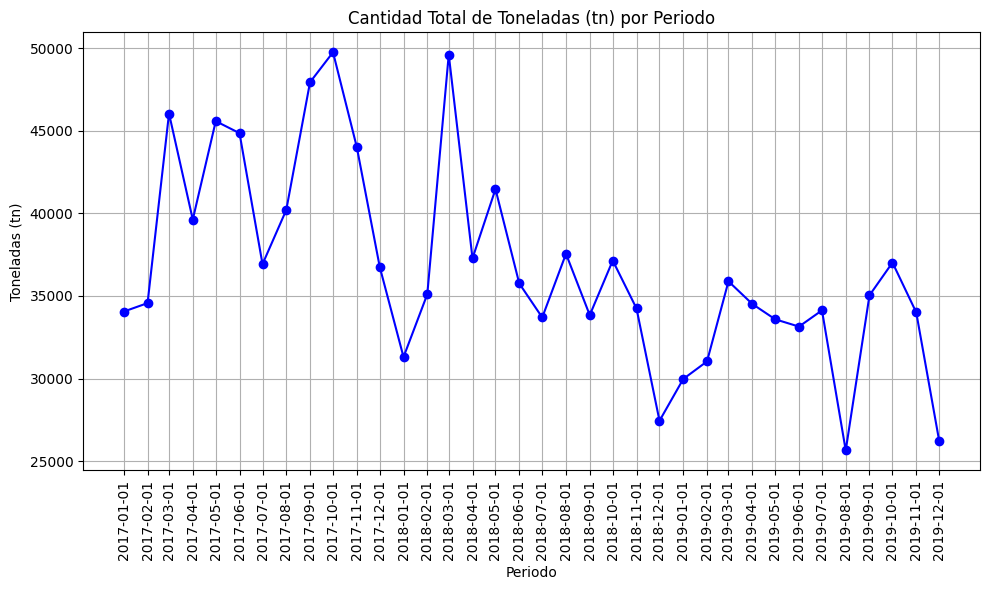

In [8]:

# Cargar el DataFrame desde el archivo

# Calcular la cantidad total de toneladas (tn) por periodo
total_tn_por_periodo = sell_in.groupby('periodo')['tn'].sum().reset_index()

# Convertir la columna 'periodo' a tipo datetime para el gráfico de línea
total_tn_por_periodo['periodo'] = pd.to_datetime(total_tn_por_periodo['periodo'], format='%Y%m')

# Crear el gráfico de línea
plt.figure(figsize=(10, 6))
plt.plot(total_tn_por_periodo['periodo'], total_tn_por_periodo['tn'], marker='o', linestyle='-', color='b')
plt.title('Cantidad Total de Toneladas (tn) por Periodo')
plt.xlabel('Periodo')
plt.ylabel('Toneladas (tn)')
plt.grid(True)
#plt.xticks(rotation=45)
#plt.tight_layout()

# Mostrar el gráfico
#plt.show()
# Ajustar las etiquetas del eje x para que estén en formato vertical
plt.xticks(rotation=90)

# Asegurar que todas las etiquetas se muestren
plt.gca().set_xticks(total_tn_por_periodo['periodo'])

# Ajustar el diseño para evitar recortes
plt.tight_layout()

# Mostrar el gráfico
plt.show()

In [9]:
sell_in.shape

(2945818, 7)

In [5]:
sell_in['diferencia_tn'] = sell_in['cust_request_tn'] - sell_in['tn']


In [11]:
sell_in.head(15)

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,diferencia_tn
0,201701,10234,20524,0,2,0.05300,0.05300,0.0
1,201701,10032,20524,0,1,0.13628,0.13628,0.0
2,201701,10217,20524,0,1,0.03028,0.03028,0.0
3,201701,10125,20524,0,1,0.02271,0.02271,0.0
4,201701,10012,20524,0,11,1.54452,1.54452,0.0
5,201701,10080,20524,0,1,0.01514,0.01514,0.0
6,201701,10015,20524,0,4,0.10600,0.10600,0.0
7,201701,10062,20524,0,1,0.18928,0.18928,0.0
8,201701,10159,20524,0,3,0.02271,0.02271,0.0
9,201701,10183,20524,0,1,0.01514,0.01514,0.0


In [12]:
sell_in.describe()

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,diferencia_tn
count,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06
mean,2.018017e+05,1.017148e+04,2.042787e+04,1.155163e-02,2.148753e+00,4.593203e-01,4.497863e-01,9.534001e-03
std,8.142115e+01,1.421467e+02,3.124612e+02,1.068559e-01,3.571552e+00,3.222836e+00,3.108355e+00,3.760922e-01
min,2.017010e+05,1.000100e+04,2.000100e+04,0.000000e+00,1.000000e+00,1.000000e-04,1.000000e-04,-1.519277e+01
25%,2.017090e+05,1.005300e+04,2.016100e+04,0.000000e+00,1.000000e+00,1.029000e-02,1.027000e-02,0.000000e+00
50%,2.018050e+05,1.013300e+04,2.036600e+04,0.000000e+00,1.000000e+00,3.931000e-02,3.931000e-02,0.000000e+00
75%,2.019030e+05,1.026700e+04,2.065400e+04,0.000000e+00,2.000000e+00,1.572500e-01,1.572500e-01,0.000000e+00
max,2.019120e+05,1.063700e+04,2.129900e+04,1.000000e+00,9.200000e+01,5.515614e+02,5.478785e+02,1.405797e+02


In [6]:
sell_in_group = sell_in.groupby(['periodo', 'product_id', "customer_id"]).agg({
    'cust_request_tn': 'sum',
    'tn': 'sum',
    'diferencia_tn': 'sum'
}).reset_index()

In [49]:
sell_in_group.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn
0,201701,20001,10001,99.43861,99.43861,0.00000
1,201701,20001,10002,38.68301,35.72806,2.95495
2,201701,20001,10003,143.49426,143.49426,0.00000
3,201701,20001,10004,184.72927,184.72927,0.00000
4,201701,20001,10005,19.08407,19.08407,0.00000


In [15]:

#sell_in_group2 = pd.merge(sell_in_group, tb_stocks[['periodo', 'product_id', 'stock_final']], on=['periodo', 'product_id'], how='left')



In [16]:
#sell_in_group2.tail()

#### **tb_productos**

In [17]:
tb_productos.shape

(1262, 6)

In [18]:
tb_productos['cat2'].nunique()


15

In [19]:
tb_productos.groupby(['cat2', 'cat3']).size().nunique()


28

#### **tb_productos_descripcion**

In [20]:
tb_productos_descripcion.head()

,cat1,cat2,cat3,brand,sku_size,product_id,descripcion
0,FOODS,ADEREZOS,Aji Picante,NATURA,240,20609,Salsa Aji Picante
1,FOODS,ADEREZOS,Barbacoa,NATURA,250,20266,Salsa Barbacoa
2,FOODS,ADEREZOS,Barbacoa,NATURA,400,20325,Salsa Barbacoa
3,FOODS,ADEREZOS,Barbacoa,NATURA,500,20503,Salsa Barbacoa
4,FOODS,ADEREZOS,Chimichurri,NATURA,350,20797,Chimichurri


In [21]:
tb_productos_descripcion.drop_duplicates(subset=['cat1', 'cat2', 'cat3', 'brand', 'descripcion']).shape[0]



837

In [22]:
tb_productos_descripcion.shape

(1251, 7)

In [23]:
tb_productos_descripcion['cat2'].nunique()


15

#### **tb_stocks**


In [24]:
tb_stocks.head(10)

,periodo,product_id,stock_final
0,201810,20524,1.61267
1,201810,20311,2.93657
2,201810,20654,6.83269
3,201810,21005,1.01338
4,201810,20974,0.34595
5,201810,20828,10.51140
6,201810,20941,1.49926
7,201810,20803,0.86351
8,201810,20781,3.71171
9,201810,20638,36.99762


In [25]:
tb_stocks.shape

(13691, 3)

#### **productos_predecir**

In [26]:
productos_predecir.head()

,product_id
0,20001
1,20002
2,20003
3,20004
4,20005


In [27]:
productos_predecir.count()

product_id    780
dtype: int64

#### **Combinacion de sell in y de productos_descripcion**

In [7]:
sell_in_productos = pd.merge(sell_in_group, tb_productos_descripcion,  on='product_id', how='left')

In [8]:
sell_in_productos.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,10001,99.43861,99.43861,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20001,10002,38.68301,35.72806,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
2,201701,20001,10003,143.49426,143.49426,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
3,201701,20001,10004,184.72927,184.72927,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
4,201701,20001,10005,19.08407,19.08407,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma


In [52]:
sell_in.shape

(2945818, 8)

In [53]:
sell_in_group.shape

(2945818, 6)

In [54]:
sell_in_productos.shape

(2945818, 12)

In [9]:
sell_in_productos.isna().sum()

periodo               0
product_id            0
customer_id           0
cust_request_tn       0
tn                    0
diferencia_tn         0
cat1               7448
cat2               7448
cat3               7448
brand              7448
sku_size           7448
descripcion        7448
dtype: int64

In [10]:
sell_in_productos[sell_in_productos['cat1'].isna()].tail()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
2805571,201910,20918,10001,16.08149,16.08149,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2813145,201910,21169,10004,9.00356,9.00356,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2814147,201910,21228,10162,0.00452,0.00452,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2814148,201910,21228,10233,0.06028,0.06028,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2887530,201911,21228,10174,0.05425,0.05425,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
sell_in_productos.describe()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,sku_size
count,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.945818e+06,2.938370e+06
mean,2.018017e+05,2.042787e+04,1.017148e+04,4.593203e-01,4.497863e-01,9.534001e-03,4.468480e+02
std,8.142115e+01,3.124612e+02,1.421467e+02,3.222836e+00,3.108355e+00,3.760922e-01,7.456050e+02
min,2.017010e+05,2.000100e+04,1.000100e+04,1.000000e-04,1.000000e-04,-1.519277e+01,1.000000e+00
25%,2.017090e+05,2.016100e+04,1.005300e+04,1.029000e-02,1.027000e-02,0.000000e+00,9.000000e+01
50%,2.018050e+05,2.036600e+04,1.013300e+04,3.931000e-02,3.931000e-02,0.000000e+00,2.400000e+02
75%,2.019030e+05,2.065400e+04,1.026700e+04,1.572500e-01,1.572500e-01,0.000000e+00,4.500000e+02
max,2.019120e+05,2.129900e+04,1.063700e+04,5.515614e+02,5.478785e+02,1.405797e+02,1.000000e+04


**PRODUCTOS A PREDECIR EN DICIEMBRE 2019**

In [12]:
product_ids_201912 = sell_in_productos[sell_in_productos['periodo'] == 201912]['product_id'].unique()
product_ids_201912

array([20001, 20002, 20003, 20004, 20005, 20006, 20007, 20008, 20009,
       20010, 20011, 20012, 20013, 20014, 20015, 20016, 20017, 20018,
       20019, 20020, 20021, 20022, 20023, 20024, 20025, 20026, 20027,
       20028, 20029, 20030, 20031, 20032, 20033, 20035, 20037, 20038,
       20039, 20041, 20042, 20043, 20044, 20045, 20046, 20047, 20048,
       20049, 20050, 20051, 20052, 20053, 20054, 20055, 20056, 20057,
       20058, 20059, 20061, 20062, 20063, 20065, 20066, 20067, 20068,
       20069, 20070, 20071, 20072, 20073, 20074, 20075, 20076, 20077,
       20078, 20079, 20080, 20081, 20082, 20084, 20085, 20086, 20087,
       20088, 20089, 20090, 20091, 20092, 20093, 20094, 20095, 20096,
       20097, 20099, 20100, 20101, 20102, 20103, 20105, 20106, 20107,
       20108, 20109, 20111, 20112, 20113, 20114, 20115, 20116, 20117,
       20118, 20119, 20120, 20121, 20122, 20123, 20124, 20125, 20126,
       20127, 20128, 20129, 20130, 20132, 20133, 20134, 20135, 20136,
       20137, 20138,

In [13]:
len(product_ids_201912)

927

**PRODUCTOS A PREDECIR SI LO HAGO CON 201912**

In [14]:
sell_in_productos_201912 = sell_in_productos[sell_in_productos['product_id'].isin(product_ids_201912)]


In [15]:
sell_in_productos_201912.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,10001,99.43861,99.43861,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20001,10002,38.68301,35.72806,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
2,201701,20001,10003,143.49426,143.49426,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
3,201701,20001,10004,184.72927,184.72927,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
4,201701,20001,10005,19.08407,19.08407,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma


Lo filtro por los 780 productos a predecir:

#### **Filtro por los productos a predecir para 202002**

In [36]:
sell_in_productos.describe()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size
count,31243.000000,31243.000000,31243.000000,31243.000000,31243.000000,31014.000000
mean,201810.415773,20532.624236,43.308070,42.409134,0.898935,477.782711
std,81.679451,345.827573,113.558671,109.789323,5.373795,884.966316
min,201701.000000,20001.000000,0.000640,0.000440,-14.346800,1.000000
25%,201710.000000,20237.000000,2.309595,2.300625,0.000000,90.000000
50%,201807.000000,20491.000000,9.827020,9.781470,0.000000,250.000000
75%,201904.000000,20807.000000,30.197970,29.956800,0.003390,475.000000
max,201912.000000,21299.000000,2423.708810,2295.198320,190.704550,10000.000000


In [16]:
sell_in_productos = sell_in_productos[sell_in_productos['product_id'].isin(productos_predecir['product_id'])]


In [38]:
sell_in_productos.shape

(22349, 11)

In [17]:
sell_in_productos.isna().sum()

periodo            0
product_id         0
customer_id        0
cust_request_tn    0
tn                 0
diferencia_tn      0
cat1               0
cat2               0
cat3               0
brand              0
sku_size           0
descripcion        0
dtype: int64

Se soluciono el problemas de los NA

#### **Top 25 clientes**

Chequeo los mayores clientes del año 2019:

In [18]:
# Lista de periodos deseados
periodos = [201901, 201902, 201903, 201904, 201905, 201906, 201907, 201908, 201909, 201910, 201911, 201912]

# Filtrar las filas por los periodos deseados
filtro_periodos = sell_in[sell_in['periodo'].isin(periodos)]

# Agrupar por "customer_id" y sumarizar "tn"
sell_in_clientes = filtro_periodos.groupby('customer_id')['tn'].sum().reset_index()

sell_in_clientes = filtro_periodos.groupby('customer_id')['tn'].sum().reset_index()
sell_in_clientes.head()

,customer_id,tn
0,10001,33685.89001
1,10002,25948.00375
2,10003,20514.40695
3,10004,15890.07730
4,10005,14958.13439


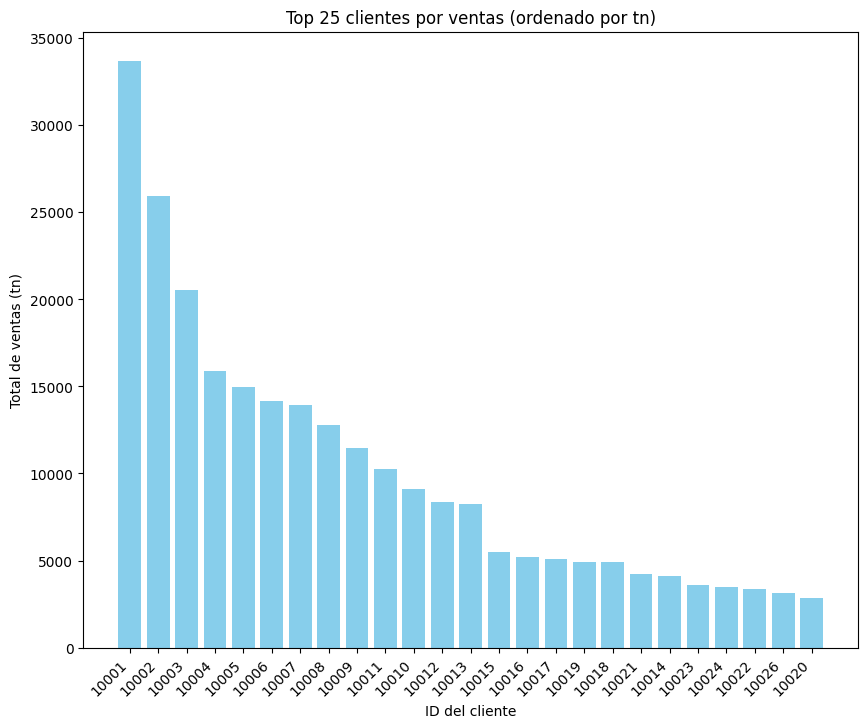

In [41]:
# Ordenar los clientes por la suma de 'tn' de mayor a menor y seleccionar los top 25
top_25_clientes = sell_in_clientes.sort_values(by='tn', ascending=False).head(25)

top_25_clientes['customer_id'] = top_25_clientes['customer_id'].astype(str)

# Crear el gráfico de barras ordenado
plt.figure(figsize=(10, 8))
plt.bar(top_25_clientes['customer_id'], top_25_clientes['tn'], color='skyblue')
plt.xlabel('ID del cliente')
plt.ylabel('Total de ventas (tn)')
plt.title('Top 25 clientes por ventas (ordenado por tn)')
plt.xticks(rotation=45, ha='right')  # Rotar los IDs de cliente para mejor legibilidad
plt.gca()  # Invertir el eje y para ordenar de mayor a menor
plt.show()

#### **Variables de Prophet**

In [19]:
prophet_data = "prophet_fe_data.csv"
df_prophet = pd.read_csv(prophet_data, decimal='.', delimiter=',', encoding='utf-8')

In [20]:
columnas= ['trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper', 
                          'additive_terms', 'additive_terms_lower', 'additive_terms_upper', 
                          'yearly', 'yearly_lower', 'yearly_upper']

for columna in columnas:
    df_prophet[columna] = df_prophet[columna].apply(lambda x: max(x, 0))

In [21]:
df_prophet['periodo'] = pd.to_datetime(df_prophet['ds'], format='%Y-%m-%d')
df_prophet['periodo'] = df_prophet['periodo'].dt.strftime('%Y%m').astype(int)

In [22]:
columnas_seleccionadas= ['periodo', 'product_id', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper', 
                          'additive_terms', 'additive_terms_lower', 'additive_terms_upper', 
                          'yearly', 'yearly_lower', 'yearly_upper']

df_prophet = df_prophet[columnas_seleccionadas]

In [23]:
df_prophet.head()

,periodo,product_id,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper
0,201701,20001,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,201702,20001,1262.235256,552.200472,1185.622572,1262.235256,1262.235256,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,201703,20001,1271.645129,1169.577591,1836.598993,1271.645129,1271.645129,241.601638,241.601638,241.601638,241.601638,241.601638,241.601638
3,201704,20001,1280.751458,743.639264,1375.402442,1280.751458,1280.751458,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,201705,20001,1290.161331,1094.231747,1724.686243,1290.161331,1290.161331,118.402960,118.402960,118.402960,118.402960,118.402960,118.402960


In [24]:
sell_in_productos_fe  = sell_in_productos_201912.merge(df_prophet, on=['product_id', 'periodo'], how='left')
sell_in_productos_fe.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper
0,201701,20001,10001,99.43861,99.43861,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0
1,201701,20001,10002,38.68301,35.72806,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0
2,201701,20001,10003,143.49426,143.49426,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0
3,201701,20001,10004,184.72927,184.72927,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0
4,201701,20001,10005,19.08407,19.08407,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
sell_in_productos_fe.dtypes

periodo                   int64
product_id                int64
customer_id               int64
cust_request_tn         float64
tn                      float64
diferencia_tn           float64
cat1                     object
cat2                     object
cat3                     object
brand                    object
sku_size                float64
descripcion              object
trend                   float64
yhat_lower              float64
yhat_upper              float64
trend_lower             float64
trend_upper             float64
additive_terms          float64
additive_terms_lower    float64
additive_terms_upper    float64
yearly                  float64
yearly_lower            float64
yearly_upper            float64
dtype: object

In [51]:
#sell_in_productos_fe['periodo'] = pd.to_datetime(sell_in_productos_fe['periodo'], format='%Y%m')


#### **Target**

In [26]:
### Agrego el target
sell_in_productos_fe['target'] = sell_in_productos_fe.groupby('product_id')['tn'].shift(-2)

In [27]:
sell_in_productos_fe.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target
0,201701,20001,10001,99.43861,99.43861,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,143.49426
1,201701,20001,10002,38.68301,35.72806,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,184.72927
2,201701,20001,10003,143.49426,143.49426,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,19.08407
3,201701,20001,10004,184.72927,184.72927,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,43.83179
4,201701,20001,10005,19.08407,19.08407,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,65.12087


#### Estandarizo cada serie

In [28]:

# Copiar el DataFrame original
sell_in_trans = sell_in_productos_fe.copy()

# Seleccionar las columnas numéricas
columnas_numericas = sell_in_productos_fe.select_dtypes(include=['float64', 'int64']).columns
columnas_numericas = columnas_numericas.drop(['periodo', 'customer_id', 'product_id', 'target'])

# Inicializar el escalador
scaler = StandardScaler()

# Ajustar y transformar las columnas numéricas en los datos de entrenamiento
sell_in_trans[columnas_numericas] = scaler.fit_transform(sell_in_trans[columnas_numericas])




In [29]:
columnas_numericas

Index(['cust_request_tn', 'tn', 'diferencia_tn', 'sku_size', 'trend',
       'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'yearly', 'yearly_lower', 'yearly_upper'],
      dtype='object')

In [84]:
sell_in_trans.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target
0,201701,20001,10001,29.169208,30.263303,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,143.49426
1,201701,20001,10002,11.259533,10.780176,7.375108,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,184.72927
2,201701,20001,10003,42.156033,43.735825,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,19.08407
3,201701,20001,10004,54.311384,56.345777,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,43.83179
4,201701,20001,10005,5.482112,5.690329,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,65.12087


In [30]:
sell_in_productos_fe.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target
0,201701,20001,10001,99.43861,99.43861,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,143.49426
1,201701,20001,10002,38.68301,35.72806,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,184.72927
2,201701,20001,10003,143.49426,143.49426,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,19.08407
3,201701,20001,10004,184.72927,184.72927,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,43.83179
4,201701,20001,10005,19.08407,19.08407,0.00000,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma,1253.736016,658.150779,1335.665069,1253.736016,1253.736016,0.0,0.0,0.0,0.0,0.0,0.0,65.12087


In [31]:
df = sell_in_trans.copy()
df = df.sort_values(by=['product_id', 'periodo'])

# Lags (meses)
lags = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

for lag in lags:
    df[f'lag_{lag}'] = df.groupby('product_id')['tn'].shift(lag)

# Delta lags (meses)
for lag in lags:    
    df[f'delta_lag_{lag}'] = df[f'lag_{lag}'] - df[f'lag_{lag}'].shift(1)
    
# Medias moviles
for window in lags:
    df[f'moving_avg_{window}'] = df.groupby(['product_id'])['tn'].transform(lambda x: x.shift().rolling(window=window, min_periods=window).mean())
    
# Ratios
df['ratio_3'] = df['tn'] / df['moving_avg_3']
df['ratio_6'] = df['tn'] / df['moving_avg_6']

for i in range(2, 13):
    df[f'max_{i}_months'] = (df['tn'] == df['tn'].rolling(window=i, min_periods=i).max()).astype(int)

In [32]:
import calendar


In [33]:
# Quarter
def fiscal_quarter(month):
    if month in [7, 8, 9]:
        return 1
    elif month in [10, 11, 12]:
        return 2
    elif month in [1, 2, 3]:
        return 3
    else:
        return 4

# Temporales

# Asegurarse de que 'periodo' esté en formato de cadena
df['periodo'] = df['periodo'].astype(str)

# Extraer el año de los primeros 4 caracteres y convertirlo a entero
df['Year'] = df['periodo'].str[:4].astype(int)
df['Month'] = df['periodo'].str[4:6].astype(int)

# Aplicar la función fiscal_quarter para obtener el trimestre fiscal
df['Q'] = df['Month'].apply(fiscal_quarter)

# Calcular el número de días en cada mes
df['Days_Month'] = df.apply(lambda row: calendar.monthrange(row['Year'], row['Month'])[1], axis=1)

# Convertir 'periodo' a un objeto datetime
df['periodo'] = pd.to_datetime(df['periodo'], format='%Y%m')

# Calcular las características de continuidad
df['month_sin'] = np.sin(2 * np.pi * df['periodo'].dt.month / 12)
df['month_cos'] = np.cos(2 * np.pi * df['periodo'].dt.month / 12)

In [87]:
df.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months
0,201701,20001,10001,29.169208,30.263303,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,143.49426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0
1,201701,20001,10002,11.259533,10.780176,7.375108,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,184.72927,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0
2,201701,20001,10003,42.156033,43.735825,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,19.08407,10.780176,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-19.483127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.780176,20.521740,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,0,0,0,0,0,0,0
3,201701,20001,10004,54.311384,56.345777,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,43.83179,43.735825,10.780176,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.955649,-19.483127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.735825,27.258001,28.259768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.993851,NaN,1,1,1,0,0,0,0,0,0,0,0
4,201701,20001,10005,5.482112,5.690329,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,65.12087,56.345777,43.735825,10.780176,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.609951,32.955649,-19.483127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.345777,50.040801,36.953926,35.28127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.153984,NaN,0,0,0,0,0,0,0,0,0,0,0


In [34]:
df_20001 = df.query("product_id == 20001")
df_20001.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos
0,2017-01-01,20001,10001,29.169208,30.263303,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,143.49426,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,1,3,31,0.5,0.866025
1,2017-01-01,20001,10002,11.259533,10.780176,7.375108,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,184.72927,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,1,3,31,0.5,0.866025
2,2017-01-01,20001,10003,42.156033,43.735825,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,19.08407,10.780176,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-19.483127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.780176,20.521740,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,0,0,0,0,0,0,0,0,2017,1,3,31,0.5,0.866025
3,2017-01-01,20001,10004,54.311384,56.345777,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,43.83179,43.735825,10.780176,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.955649,-19.483127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.735825,27.258001,28.259768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.993851,NaN,1,1,1,0,0,0,0,0,0,0,0,2017,1,3,31,0.5,0.866025
4,2017-01-01,20001,10005,5.482112,5.690329,-0.026129,HC,ROPA LAVADO,Liquido,ARIEL,3.486107,genoma,7.875836,5.096282,6.491397,7.875836,7.875836,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,-0.202595,65.12087,56.345777,43.735825,10.780176,30.263303,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.609951,32.955649,-19.483127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.345777,50.040801,36.953926,35.28127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.153984,NaN,0,0,0,0,0,0,0,0,0,0,0,2017,1,3,31,0.5,0.866025


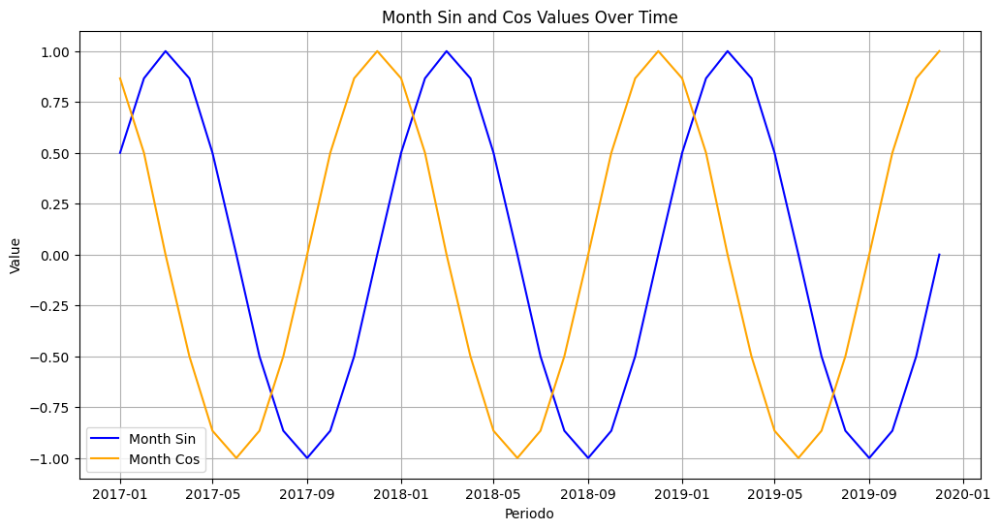

In [29]:
# Plotear las columnas 'periodo', 'month_sin' y 'month_cos'
plt.figure(figsize=(12, 6))
plt.plot(df_20001['periodo'], df_20001['month_sin'], label='Month Sin', color='blue')
plt.plot(df_20001['periodo'], df_20001['month_cos'], label='Month Cos', color='orange')

plt.xlabel('Periodo')
plt.ylabel('Value')
plt.title('Month Sin and Cos Values Over Time')
plt.legend()
plt.grid(True)
plt.show()

In [35]:
df.isna().sum()

periodo            0
product_id         0
customer_id        0
cust_request_tn    0
tn                 0
                  ..
Month              0
Q                  0
Days_Month         0
month_sin          0
month_cos          0
Length: 79, dtype: int64

In [65]:
# Definir el nombre del archivo de salida
#nombre_archivo = 'suma_tn_por_product_id.xlsx'

# Guardar el DataFrame en Excel
#ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/' + nombre_archivo
#suma_tn_por_product_id.to_excel(ruta_salida, index=False)

#### **One hot**

In [36]:
df = pd.get_dummies(df, columns=['cat1', 'cat2', 'cat3', 'brand', 'descripcion'])


In [37]:
df.head()

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Chimichurri,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Frutas,cat3_Galletitas,cat3_Gel,cat3_Gel Ducha,cat3_Hierbas,cat3_INDUSTRIAL,cat3_JABON LIQUIDO,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_LV ROPA LIQUIDO,cat3_LV ROPA POLVO,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PACKS,cat3_PISOS,cat3_POST WASH,cat3_Pastas,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_FRANCIA,brand_GOMINA,brand_HARINAMA,brand_INDUSTRIAL,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Accion Profunda,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 10,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Aloe Vera,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Active Gel Pepino,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Anti Stress,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 19,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,

In [93]:
df.dtypes

periodo                        int64
product_id                     int64
customer_id                    int64
cust_request_tn              float64
tn                           float64
                              ...   
descripcion_ropa negra          bool
descripcion_rulos vitales       bool
descripcion_sport               bool
descripcion_sport extremo       bool
descripcion_trigo               bool
Length: 718, dtype: object

#### **XGBoost con semillerio**

##### Prueba 1- Entreno con todos los periodos, valido con 201910, para predecir 201912

In [38]:
df_customer = df[df['customer_id'] == 10001]
df_customer

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Chimichurri,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Frutas,cat3_Galletitas,cat3_Gel,cat3_Gel Ducha,cat3_Hierbas,cat3_INDUSTRIAL,cat3_JABON LIQUIDO,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_LV ROPA LIQUIDO,cat3_LV ROPA POLVO,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PACKS,cat3_PISOS,cat3_POST WASH,cat3_Pastas,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_FRANCIA,brand_GOMINA,brand_HARINAMA,brand_INDUSTRIAL,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Accion Profunda,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 10,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Aloe Vera,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Active Gel Pepino,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Anti Stress,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 19,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,

In [39]:
df_customer['periodo'] = pd.to_datetime(df_customer['periodo'], format='%Y%m%d')
df_customer

C:\Users\jnnov\AppData\Local\Temp\ipykernel_26844\1588838343.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_customer['periodo'] = pd.to_datetime(df_customer['periodo'], format='%Y%m%d')


,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Chimichurri,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Frutas,cat3_Galletitas,cat3_Gel,cat3_Gel Ducha,cat3_Hierbas,cat3_INDUSTRIAL,cat3_JABON LIQUIDO,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_LV ROPA LIQUIDO,cat3_LV ROPA POLVO,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PACKS,cat3_PISOS,cat3_POST WASH,cat3_Pastas,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_FRANCIA,brand_GOMINA,brand_HARINAMA,brand_INDUSTRIAL,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Accion Profunda,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 10,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Aloe Vera,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Active Gel Pepino,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Anti Stress,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 19,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,

In [40]:
import warnings
warnings.filterwarnings("ignore")

In [41]:
df_customer

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Chimichurri,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Frutas,cat3_Galletitas,cat3_Gel,cat3_Gel Ducha,cat3_Hierbas,cat3_INDUSTRIAL,cat3_JABON LIQUIDO,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_LV ROPA LIQUIDO,cat3_LV ROPA POLVO,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PACKS,cat3_PISOS,cat3_POST WASH,cat3_Pastas,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_FRANCIA,brand_GOMINA,brand_HARINAMA,brand_INDUSTRIAL,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Accion Profunda,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 10,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Aloe Vera,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Active Gel Pepino,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Anti Stress,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 19,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,

In [44]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import optuna

df_customer = df[df['customer_id'] == 10001]


# Convertir 'periodo' a datetime si no lo está
df_customer['periodo'] = pd.to_datetime(df_customer['periodo'], format='%Y%m')

# Ordenar los datos por 'periodo'
df_customer = df_customer.sort_values('periodo')

# Definir las fechas de corte como objetos datetime
train_cutoff = pd.to_datetime('2019-06-01')
val_cutoff = pd.to_datetime('2019-08-01')
test_cutoff = pd.to_datetime('2019-10-01')

# Filtrar datos para entrenamiento y validación
df_train = df_customer[df_customer['periodo'] <= train_cutoff]
df_val = df_customer[(df_customer['periodo'] > train_cutoff) & (df_customer['periodo'] <= val_cutoff)]
df_test = df_customer[df_customer['periodo'] == test_cutoff]



# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo','target'], axis=1)
y_test = df_test['target']

In [45]:
#NO USAR



#scaler2 = StandardScaler()

#y_train["target"] = scaler2.fit_transform(df_train['target'].values.reshape(-1,1))

# Definir función de objetivo para la optimización de hyperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }

    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    rmse = mean_squared_error(y_val, y_pred, squared=False)
    return rmse

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [0, 1, 2, 3, 4]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de validación
val_rmse = mean_squared_error(y_val, final_prediction, squared=False)
print("RMSE en conjunto de validación (promedio de semillas):", val_rmse)


[I 2024-07-08 20:09:58,145] A new study created in memory with name: no-name-966c65a3-f18b-4cb0-8848-bc03cb8941e7
[I 2024-07-08 20:10:02,373] Trial 0 finished with value: 5.009866583812903 and parameters: {'learning_rate': 0.27075361255380354, 'max_depth': 8, 'min_child_weight': 9, 'subsample': 0.8946199277334693, 'colsample_bytree': 0.5109336292338348, 'n_estimators': 471}. Best is trial 0 with value: 5.009866583812903.
[W 2024-07-08 20:10:03,193] Trial 1 failed with parameters: {'learning_rate': 0.1538357407709051, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.5337833398836589, 'colsample_bytree': 0.5279260135623745, 'n_estimators': 209} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\study\_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\jnnov\AppData\Local\Temp\ipykernel_268

KeyboardInterrupt: 

---
----

In [46]:



#scaler2 = StandardScaler()

#y_train["target"] = scaler2.fit_transform(df_train['target'].values.reshape(-1,1))

# Definir función de objetivo para la optimización de hyperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }
#    seeds = [111111,222222,333333,444444,555555,666666,777777,888888,999999,121212,131313,141414,151515,161616,171717]

    # Entrenar y validar con cada una de las semillas
    seeds = [111111,222222]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=5, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)




[I 2024-07-08 20:10:14,208] A new study created in memory with name: no-name-9ee737e7-e8f2-4a84-bc41-3129046f124d
[I 2024-07-08 20:10:20,391] Trial 0 finished with value: 4.84910901686175 and parameters: {'learning_rate': 0.22511660334668585, 'max_depth': 9, 'min_child_weight': 1, 'subsample': 0.8641617568087793, 'colsample_bytree': 0.7059351921868957, 'n_estimators': 201}. Best is trial 0 with value: 4.84910901686175.
[I 2024-07-08 20:10:24,439] Trial 1 finished with value: 4.745827969688413 and parameters: {'learning_rate': 0.23248214555063765, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.6797351227116833, 'colsample_bytree': 0.5211197562191183, 'n_estimators': 724}. Best is trial 1 with value: 4.745827969688413.
[I 2024-07-08 20:10:32,317] Trial 2 finished with value: 4.803830253318564 and parameters: {'learning_rate': 0.022564344057084455, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.8863704323563293, 'colsample_bytree': 0.5887814982974513, 'n_estimators': 150}. 

Mejores hiperparámetros: {'learning_rate': 0.07372908652302816, 'max_depth': 8, 'min_child_weight': 5, 'subsample': 0.7582062769619049, 'colsample_bytree': 0.6661254310423539, 'n_estimators': 173}


In [47]:
# Entrenar y predecir con 5 semillas diferentes
seeds = [0, 1, 2, 3, 4]
val_rmse_results = []
predictions = pd.DataFrame()

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=5, verbose=False) #earle stop
    y_pred = model.predict(X_test)
    val_rmse = mean_squared_error(y_test, y_pred, squared=False)
    val_rmse_results.append(val_rmse)
    predictions[f'Prediction_seed_{seed}'] = y_pred

predictions['product_id'] = df_test['product_id'].values

# Imprimir resultados de RMSE para cada semilla
for i, val_rmse in enumerate(val_rmse_results):
    print(f"RMSE en conjunto de validación para semilla {seeds[i]}: {val_rmse}")

RMSE en conjunto de validación para semilla 0: 6.050083149893456
RMSE en conjunto de validación para semilla 1: 5.781334131589228
RMSE en conjunto de validación para semilla 2: 6.0103169934088605
RMSE en conjunto de validación para semilla 3: 6.905512704461946
RMSE en conjunto de validación para semilla 4: 6.202181101021195


In [48]:
df_test[df_test['product_id']==20001]

,periodo,product_id,customer_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Chimichurri,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Frutas,cat3_Galletitas,cat3_Gel,cat3_Gel Ducha,cat3_Hierbas,cat3_INDUSTRIAL,cat3_JABON LIQUIDO,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_LV ROPA LIQUIDO,cat3_LV ROPA POLVO,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PACKS,cat3_PISOS,cat3_POST WASH,cat3_Pastas,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_FRANCIA,brand_GOMINA,brand_HARINAMA,brand_INDUSTRIAL,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Accion Profunda,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 10,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Aloe Vera,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Active Gel Pepino,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Anti Stress,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 19,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,

In [49]:
predictions[predictions['product_id'] == 20001]

,Prediction_seed_0,Prediction_seed_1,Prediction_seed_2,Prediction_seed_3,Prediction_seed_4,product_id
395,134.318726,84.760727,118.977295,113.188278,131.532104,20001


In [50]:
df201912 = sell_in_productos_fe[(sell_in_productos_fe['periodo'] == 201912) & (sell_in_productos_fe['customer_id'] == 10001)][['product_id', 'tn']]
df201912

,product_id,tn
2454986,20001,180.21938
2455162,20002,334.03714
2455260,20003,137.98717
2455421,20004,12.94020
2455579,20005,7.66693
...,...,...
2512596,21227,0.00860
2512882,21264,0.00111
2512887,21265,0.02958
2512892,21266,0.02958


----
-----
----
---
--


**PARA VARIOS CUSTOMER_ID**

In [51]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Supongamos que el DataFrame 'df' ya está definido
# df = pd.read_csv('tus_datos.csv')

# Lista de customer_ids
customer_ids_top_50 = [10001,
10002,
10003,
10004,
10005,
10006,
10007,
10008,
10009,
10010,
10011,
10012,
10013,
10014,
10015,
10016,
10017,
10018,
10019,
10020,
10021,
10022,
10023,
10024,
10025,
10026,
10027,
10030,
10031,
10032
]  # Reemplaza con tu lista real

# DataFrame para almacenar todas las predicciones
all_predictions = pd.DataFrame()

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }

    # Entrenar y validar con cada una de las semillas
    seeds = [111111,222222,333333,444444,555555,666666,777777,888888,999999,121212,131313,141414,151515,161616,171717,181818,191919,202020,212121,222222,232323,242424,252525,262626]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=5, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [1111, 2222, 3333, 4444, 5555]

for customer_id in customer_ids_top_50:
    df_customer = df[df['customer_id'] == customer_id]
    
    # Convertir 'periodo' a datetime si no lo está ya
    df_customer['periodo'] = pd.to_datetime(df_customer['periodo'], format='%Y%m')

    # Ordenar los datos por 'periodo'
    df_customer = df_customer.sort_values('periodo')

    # Definir las fechas de corte
    train_cutoff = pd.to_datetime('2019-06-01')
    val_cutoff = pd.to_datetime('2019-08-01')
    test_cutoff = pd.to_datetime('2019-10-01')

    # Filtrar datos para entrenamiento, validación y prueba
    df_train = df_customer[df_customer['periodo'] <= train_cutoff]
    df_val = df_customer[(df_customer['periodo'] > train_cutoff) & (df_customer['periodo'] <= val_cutoff)]
    df_test = df_customer[df_customer['periodo'] == test_cutoff]

    # Separar características (X) y variable objetivo (y)
    X_train = df_train.drop(['periodo', 'target'], axis=1)
    y_train = df_train['target']
    X_val = df_val.drop(['periodo', 'target'], axis=1)
    y_val = df_val['target']
    X_test = df_test.drop(['periodo', 'target'], axis=1)
    y_test = df_test['target']
    
    predictions = pd.DataFrame()
    for seed in seeds:
        model = xgb.XGBRegressor(random_state=seed, **best_params)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=5, verbose=False)
        y_pred = model.predict(X_test)
        predictions[f'Prediction_seed_{seed}'] = y_pred

    predictions['product_id'] = df_test['product_id'].values
    predictions['customer_id'] = customer_id

    all_predictions = pd.concat([all_predictions, predictions], ignore_index=True)

# Mostrar el DataFrame final con todas las predicciones
print(all_predictions)


[I 2024-07-08 20:12:27,905] A new study created in memory with name: no-name-c9dd25ec-7ddc-48c0-8a30-eacbf5c4ed23
[I 2024-07-08 20:12:35,222] Trial 0 finished with value: 4.764191669100992 and parameters: {'learning_rate': 0.2611828900703459, 'max_depth': 10, 'min_child_weight': 9, 'subsample': 0.8925286713811902, 'colsample_bytree': 0.8333551026232042, 'n_estimators': 119}. Best is trial 0 with value: 4.764191669100992.
[I 2024-07-08 20:12:39,772] Trial 1 finished with value: 4.927661015323205 and parameters: {'learning_rate': 0.17581401726468188, 'max_depth': 9, 'min_child_weight': 1, 'subsample': 0.9193622917356719, 'colsample_bytree': 0.52410461450909, 'n_estimators': 211}. Best is trial 0 with value: 4.764191669100992.
[I 2024-07-08 20:12:42,338] Trial 2 finished with value: 4.927980507648895 and parameters: {'learning_rate': 0.20455875965038955, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.6607841987411054, 'colsample_bytree': 0.7137312711112711, 'n_estimators': 435}. Be

Mejores hiperparámetros: {'learning_rate': 0.2159423105751704, 'max_depth': 7, 'min_child_weight': 1, 'subsample': 0.9527182747615079, 'colsample_bytree': 0.6432334967605822, 'n_estimators': 110}
      Prediction_seed_0  Prediction_seed_1  Prediction_seed_2  \
0              0.200896           0.247122           0.228836   
1              3.991992           5.253195           4.123039   
2              0.149487           0.173475           0.169635   
3              7.441889           5.680991           6.080548   
4              3.040252           2.275162           2.309141   
...                 ...                ...                ...   
3274           0.304807           0.293375           0.322742   
3275           0.542705           0.491986           0.464913   
3276           1.345243           1.366228           1.276283   
3277           0.419895           0.476841           0.442247   
3278           0.963530           0.811114           1.129249   

      Prediction_seed_3

In [52]:
all_predictions.groupby(['product_id']).agg({'Prediction_seed_0':"sum",'Prediction_seed_1':"sum",'Prediction_seed_2':"sum",'Prediction_seed_3':"sum",'Prediction_seed_4':"sum", })

,Prediction_seed_0,Prediction_seed_1,Prediction_seed_2,Prediction_seed_3,Prediction_seed_4
product_id,,,,,
20001,507.808228,528.433105,484.542664,512.830505,532.481628
20002,466.439270,308.895630,379.954163,411.094513,458.622070
20003,195.010132,212.657761,273.316925,165.679428,207.122284
20004,100.321404,96.496338,117.135300,91.063393,83.981812
20005,158.432816,118.439919,176.522858,186.077789,167.467712
...,...,...,...,...,...
21227,0.091519,0.115647,0.095844,0.095584,0.120331
21255,0.673615,0.596964,0.576216,0.656407,0.589939
21257,0.673615,0.596964,0.576216,0.656407,0.589939


In [53]:

all_predictions[all_predictions['product_id']==20001]

,Prediction_seed_0,Prediction_seed_1,Prediction_seed_2,Prediction_seed_3,Prediction_seed_4,product_id,customer_id
395,103.672203,140.044189,77.301559,97.674126,114.938057,20001,10001
766,245.735016,226.577179,220.321732,271.839386,232.788818,20001,10002
1803,65.002884,42.266937,81.398178,63.177811,71.585648,20001,10004
2052,78.442871,107.907631,86.261459,66.041245,108.256546,20001,10005
2709,14.955233,11.637153,19.259727,14.097905,4.912539,20001,10003


In [59]:
df201912 = sell_in_productos_fe[(sell_in_productos_fe['periodo'] == 201912) & (sell_in_productos_fe['customer_id'].isin([10005]))][['product_id', 'tn']]
df201912

,product_id,tn
2454990,20001,19.60368
2455166,20002,20.25584
2455264,20003,21.47418
2455425,20004,11.38738
2455583,20005,40.76145
...,...,...
2512357,21207,0.00586
2512506,21220,0.02162
2512546,21224,0.00253
2512665,21234,0.02162


In [94]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Supongamos que el DataFrame 'df' ya está definido
# df = pd.read_csv('tus_datos.csv')

# Lista de customer_ids
customer_ids_top_50 = [10001, 10002, 10003]  # Reemplaza con tu lista real

# DataFrame para almacenar todas las predicciones
all_predictions = pd.DataFrame()

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }

    # Entrenar y validar con cada una de las semillas
    seeds = [111111, 222222]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=5, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [0, 1, 2, 3, 4]

for customer_id in customer_ids_top_50:
    df_customer = df[df['customer_id'] == customer_id]
    
    # Convertir 'periodo' a datetime si no lo está ya
    df_customer['periodo'] = pd.to_datetime(df_customer['periodo'], format='%Y%m')

    # Ordenar los datos por 'periodo'
    df_customer = df_customer.sort_values('periodo')

    # Definir las fechas de corte
    train_cutoff = pd.to_datetime('2019-06-01')
    val_cutoff = pd.to_datetime('2019-08-01')
    test_cutoff = pd.to_datetime('2019-10-01')

    # Filtrar datos para entrenamiento, validación y prueba
    df_train = df_customer[df_customer['periodo'] <= train_cutoff]
    df_val = df_customer[(df_customer['periodo'] > train_cutoff) & (df_customer['periodo'] <= val_cutoff)]
    df_test = df_customer[df_customer['periodo'] == test_cutoff]

    # Separar características (X) y variable objetivo (y)
    X_train = df_train.drop(['periodo', 'target'], axis=1)
    y_train = df_train['target']
    X_val = df_val.drop(['periodo', 'target'], axis=1)
    y_val = df_val['target']
    X_test = df_test.drop(['periodo', 'target'], axis=1)
    y_test = df_test['target']
    
    predictions = pd.DataFrame()
    for seed in seeds:
        model = xgb.XGBRegressor(random_state=seed, **best_params)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=5, verbose=False)
        y_pred = model.predict(X_test)
        predictions[f'Prediction_seed_{seed}'] = y_pred

    predictions['product_id'] = df_test['product_id'].values
    predictions['customer_id'] = customer_id

    # Agregar al DataFrame de todas las predicciones
    all_predictions = pd.concat([all_predictions, predictions], ignore_index=True)

# Sumar las predicciones por product_id y customer_id
final_predictions = all_predictions.groupby(['product_id', 'customer_id']).sum().reset_index()

# Mostrar el DataFrame final con todas las predicciones
print(final_predictions)


[I 2024-07-07 16:01:18,352] A new study created in memory with name: no-name-13acbf97-8175-425f-8413-614009ce0cca
[I 2024-07-07 16:01:21,589] Trial 0 finished with value: 3.1770166893741103 and parameters: {'learning_rate': 0.11191822582434245, 'max_depth': 8, 'min_child_weight': 2, 'subsample': 0.779221658939596, 'colsample_bytree': 0.5427547112161802, 'n_estimators': 937}. Best is trial 0 with value: 3.1770166893741103.
[I 2024-07-07 16:01:24,173] Trial 1 finished with value: 3.2151528746302134 and parameters: {'learning_rate': 0.23416478004656688, 'max_depth': 5, 'min_child_weight': 7, 'subsample': 0.9770651989021637, 'colsample_bytree': 0.728573974553423, 'n_estimators': 609}. Best is trial 0 with value: 3.1770166893741103.
[I 2024-07-07 16:01:28,336] Trial 2 finished with value: 3.2125612392431306 and parameters: {'learning_rate': 0.043811550294545684, 'max_depth': 7, 'min_child_weight': 2, 'subsample': 0.5359669856755662, 'colsample_bytree': 0.5541166783247414, 'n_estimators': 84

Mejores hiperparámetros: {'learning_rate': 0.016450122671076088, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.5974495703955531, 'colsample_bytree': 0.7580719039182736, 'n_estimators': 707}
      product_id  customer_id  Prediction_seed_0  Prediction_seed_1  \
0          20001        10001         106.513359         125.511604   
1          20001        10002         148.668961         132.177094   
2          20001        10003          14.588414          14.922579   
3          20002        10001          86.007530          90.055840   
4          20002        10002         151.756592         122.786507   
...          ...          ...                ...                ...   
1998       21257        10003           0.418515           0.416898   
1999       21264        10001           0.610945           0.625888   
2000       21264        10003           0.418515           0.416898   
2001       21271        10001           0.610945           0.625888   
2002       21271     

In [95]:
predictions[predictions['product_id']==20001]

,Prediction_seed_0,Prediction_seed_1,Prediction_seed_2,Prediction_seed_3,Prediction_seed_4,product_id,customer_id
92,14.588414,14.922579,14.246523,14.346973,13.293259,20001,10003


---
---

In [67]:
# Entrenar y predecir con 5 semillas diferentes
seeds = [0, 1, 2, 3, 4]
val_rmse_results = []

# Función para entrenar y predecir por product_id
def train_predict_by_product(df_train, df_val, df_test, best_params, seeds):
    predictions = pd.DataFrame()

    for seed in seeds:
        model = xgb.XGBRegressor(random_state=seed, **best_params)
        model.fit(df_train.drop(['target'], axis=1), df_train['target'], eval_set=[(df_val.drop(['target'], axis=1), df_val['target'])], early_stopping_rounds=5, verbose=False)
        y_pred = model.predict(df_test.drop(['target'], axis=1))

        # Calcular RMSE para esta semilla
        val_rmse = mean_squared_error(df_test['target'], y_pred, squared=False)
        print(f"RMSE en conjunto de prueba para semilla {seed}: {val_rmse}")

        # Agregar predicciones al DataFrame
        predictions[f'Prediction_seed_{seed}'] = y_pred

    # Añadir columnas de product_id y target a las predicciones
    predictions['product_id'] = df_test['product_id'].values
    predictions['target'] = df_test['target'].values

    return predictions

# Ejemplo de uso con los conjuntos de datos df_train, df_val, df_test y semillas definidas previamente
predictions = train_predict_by_product( df_test, best_params, seeds=[0, 1, 2, 3, 4])

# Mostrar las predicciones por product_id con los RMSE por semilla
predictions_grouped = predictions.groupby('product_id').agg({'Prediction_seed_0': 'mean', 'Prediction_seed_1': 'mean', 
                                                            'Prediction_seed_2': 'mean', 'Prediction_seed_3': 'mean', 
                                                            'Prediction_seed_4': 'mean', 'target': 'mean'}).reset_index()

print(predictions_grouped)


TypeError: train_predict_by_product() missing 2 required positional arguments: 'df_test' and 'best_params'

In [79]:
df.tail()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Galletitas,cat3_Gel,cat3_Hierbas,cat3_INDUSTRIAL,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PISOS,cat3_POST WASH,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_GOMINA,brand_HARINAMA,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,descripcion_Aroma 8,descripcion_Arroz Cuatro Quesos,descripcion_Arroz hortalizas,descripcion_Avena,descripcion_Aventura,descripcion_Azul,descripcion_BB,descripcion_Baja Espuma,descripcion_Baño Biodegradable,descripcion_BioEnergético Industrial,descripcion_BioEnergético doypack,descripcion_BioEnergético gatillo,descripcion_Biodegradab

In [97]:
df201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id', 'tn']]


In [98]:
df201912.shape

(780, 2)

In [100]:
df201912["prediction"] =  final_prediction

In [101]:
df201912

,product_id,tn,prediction
21569,20001,1504.68856,1373.599243
21570,20002,1087.30855,1212.839355
21571,20003,892.50129,755.137573
21572,20004,637.90002,501.925537
21573,20005,593.24443,479.172607
...,...,...,...
22344,21263,0.01270,1.634803
22345,21265,0.05007,1.813312
22346,21266,0.05121,1.813312
22347,21267,0.01569,1.813312


In [90]:
target201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['tn']]


In [91]:
target201912

,tn
21569,1504.68856
21570,1087.30855
21571,892.50129
21572,637.90002
21573,593.24443
...,...
22344,0.01270
22345,0.05007
22346,0.05121
22347,0.01569


In [94]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Suponiendo que final_prediccion y real son los arrays con las predicciones y los valores reales respectivamente
MSE = mean_squared_error(target201912, final_prediction)
R2 = r2_score(target201912, final_prediction)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(target201912, final_prediction)


print(f'RMSE = {RMSE}')

print(f'MAE = {MAE}')
print(f'MSE = {MSE}')
print(f'R2 = {R2}')

RMSE = 23.27494979130258
MAE = 8.68074984907346
MSE = 541.7232877876559
R2 = 0.9421080504360165


In [102]:
suma_diferencia_absoluta = df201912.apply(lambda row: abs(row['tn'] - row['prediction']), axis=1).sum()
suma_diferencia_absoluta

6770.984882277298

In [103]:
suma_tn05 = df201912['prediction'].sum()

# Calcular la relación entre la suma de las diferencias absolutas y la suma de 'tn05'
error1 = suma_diferencia_absoluta / suma_tn05
error1

0.2476023588257809

Prueba 1 - Para subir a kaggle

In [110]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import optuna

# Filtrar datos para entrenamiento y validación
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']



#scaler2 = StandardScaler()

#y_train["target"] = scaler2.fit_transform(df_train['target'].values.reshape(-1,1))

# Definir función de objetivo para la optimización de hyperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
       'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000)
    }

    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    rmse = mean_squared_error(y_val, y_pred, squared=False)
    return rmse

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=200)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_val)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de validación
val_rmse = mean_squared_error(y_val, final_prediction, squared=False)
print("RMSE en conjunto de validación (promedio de semillas):", val_rmse)


[I 2024-06-23 12:04:36,072] A new study created in memory with name: no-name-77113ce9-3a5e-4809-959a-3ec42c55c115
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06-23 12:04:41,014] Trial 0 finished with value: 23.253586795423853 and parameters: {'learning_rate': 0.19424580833635505, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.616298484653037, 'colsample_bytree': 0.961131982433407, 'n_estimators': 225}. Best is trial 0 with value: 23.253586795423853.
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnin

Mejores hiperparámetros: {'learning_rate': 0.18811371781475872, 'max_depth': 6, 'min_child_weight': 10, 'subsample': 0.656610916094507, 'colsample_bytree': 0.7626233833507005, 'n_estimators': 706}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

RMSE en conjunto de validación (promedio de semillas): 23.77945156251041


In [120]:
df202002_p1 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id']]


In [121]:
df202002_p1["tn_prediction"] =  final_prediction

In [122]:
df202002_p1.head()

,product_id,tn_prediction
21569,20001,1421.086548
21570,20002,1305.845093
21571,20003,772.386414
21572,20004,488.870422
21573,20005,487.977112


In [125]:
nombre_archivo = 'df202002_p1.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones' + nombre_archivo
df202002_p1.to_csv(ruta_salida, index=False)

----
---

##### Prueba 2 - con 3 semillas entreno los parametros, con 5 para predecir. Uso validacion 201910

veo como me da en diciembre:

In [83]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Filtrar datos para entrenamiento, validación y predicción
df_train = df[df['periodo'] <= pd.to_datetime('20190601', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20190801', format='%Y%m%d')]
df_test = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo', 'target'], axis=1)
#y_test = df_test['target']

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_bin': trial.suggest_int('max_bin', 200, 1300)

    }

    seeds = [42, 84, 126]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_test)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de prueba
#test_rmse = mean_squared_error(y_test, final_prediction, squared=False)
#print("RMSE en conjunto de prueba (promedio de semillas):", test_rmse)


[I 2024-06-23 17:59:16,748] A new study created in memory with name: no-name-315b56f5-2e7e-4b36-a76d-5829d1b1df8f
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06

Mejores hiperparámetros: {'learning_rate': 0.2996699677391479, 'max_depth': 5, 'min_child_weight': 3, 'subsample': 0.9985122284111719, 'colsample_bytree': 0.972783965526449, 'n_estimators': 840, 'max_bin': 516}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

In [84]:
final_prediction

array([1.50134985e+03, 1.29555115e+03, 6.62630249e+02, 5.09048401e+02,
       4.44396240e+02, 4.56763977e+02, 4.02871002e+02, 3.76431335e+02,
       4.99207672e+02, 2.70320129e+02, 2.49317719e+02, 2.61127045e+02,
       3.66774475e+02, 3.66915741e+02, 3.05153381e+02, 2.22897095e+02,
       2.38125290e+02, 2.24885956e+02, 2.84106140e+02, 2.36057983e+02,
       1.59865921e+02, 2.07877853e+02, 2.46242279e+02, 1.68386856e+02,
       1.93656448e+02, 2.24333939e+02, 1.83808426e+02, 1.34283096e+02,
       1.39147430e+02, 1.59051239e+02, 1.43072388e+02, 5.34326538e+02,
       1.34740570e+02, 1.27116867e+02, 1.18340797e+02, 1.26640366e+02,
       1.17769058e+02, 1.23687866e+02, 1.36377670e+02, 1.21491470e+02,
       1.31177765e+02, 1.47621429e+02, 1.08477829e+02, 1.29300201e+02,
       1.92440613e+02, 1.05893272e+02, 1.25275070e+02, 9.91223297e+01,
       1.11332726e+02, 1.04543068e+02, 8.81372681e+01, 1.08646683e+02,
       1.05636086e+02, 1.08419167e+02, 1.06148300e+02, 1.12252640e+02,
      

In [96]:
df.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,sku_size,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,target,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,delta_lag_1,delta_lag_2,delta_lag_3,delta_lag_4,delta_lag_5,delta_lag_6,delta_lag_7,delta_lag_8,delta_lag_9,delta_lag_10,delta_lag_11,delta_lag_12,moving_avg_1,moving_avg_2,moving_avg_3,moving_avg_4,moving_avg_5,moving_avg_6,moving_avg_7,moving_avg_8,moving_avg_9,moving_avg_10,moving_avg_11,moving_avg_12,ratio_3,ratio_6,max_2_months,max_3_months,max_4_months,max_5_months,max_6_months,max_7_months,max_8_months,max_9_months,max_10_months,max_11_months,max_12_months,Year,Month,Q,Days_Month,month_sin,month_cos,cat1_FOODS,cat1_HC,cat1_PC,cat1_REF,cat2_ADEREZOS,cat2_CABELLO,cat2_DENTAL,cat2_DEOS,cat2_HOGAR,cat2_OTROS,cat2_PIEL1,cat2_PIEL2,cat2_PROFESIONAL,cat2_ROPA ACONDICIONADOR,cat2_ROPA LAVADO,cat2_ROPA MANCHAS,cat2_SOPAS Y CALDOS,cat2_TE,cat2_VAJILLA,cat3_ACONDICIONADOR,cat3_Acond Bebe,cat3_Acond Mujer,cat3_Aero,cat3_Aji Picante,cat3_Almidon,cat3_Antigrasa,cat3_Azul,cat3_BARRAS,cat3_Baking Bags,cat3_Barbacoa,cat3_Barra,cat3_Baño,cat3_Bizcochuelo,cat3_CREMA,cat3_CUIDADO ESPECIAL,cat3_Caldo Cubo,cat3_Caldos Granulados,cat3_Cara,cat3_Cepilllo,cat3_Concentrado,cat3_Cremoso,cat3_Cristalino,cat3_Cuerpo,cat3_DETOX,cat3_Desmaquillante,cat3_Diluido,cat3_Dishes,cat3_Especial,cat3_Esponja,cat3_Galletitas,cat3_Gel,cat3_Hierbas,cat3_INDUSTRIAL,cat3_Jabon Antibacterial,cat3_Jabon Barba,cat3_Jabon Barra,cat3_Jabon Bebe,cat3_Jabon Glicerina,cat3_Jabon Hotel,cat3_Jabon Regular,cat3_Ketchup,cat3_LAVANDINA EN GEL,cat3_LIQUIDOS,cat3_Ladrillo,cat3_Limpieza,cat3_Limpieza Cara,cat3_Liquido,cat3_Mayonesa,cat3_Mostaza,cat3_NUTRICION,cat3_Niños,cat3_NoAero,cat3_Opaco,cat3_PISOS,cat3_POST WASH,cat3_Paño,cat3_Pies Aero,cat3_Pies NoAero,cat3_Pies Talco,cat3_Polvo,cat3_Pure de Papas,cat3_Pure de Tomate,cat3_PurePapas,cat3_Repelente,cat3_RollOn,cat3_SHAMPOO,cat3_SUAVIZANTE,cat3_Salsa Golf,cat3_Salsas,cat3_Salsas Dry,cat3_Salsas Wet,cat3_Sazonadores,cat3_Shampoo Bebe,cat3_Sopas,cat3_Stick,cat3_Styling,cat3_TOILETTE,cat3_Talco,cat3_Toallitas Bebe,cat3_Tratamiento Fem,cat3_Tratamiento Masc,cat3_Verde,cat3_Vidrios,brand_ARIEL,brand_AYUDIN,brand_CAPILATIS,brand_COLBERT,brand_COLGATE,brand_DEOS1,brand_DEOS2,brand_DEOS3,brand_DOWNY,brand_ESPADOL,brand_GOMINA,brand_HARINAMA,brand_Importado,brand_JABON1,brand_LANCOME,brand_LIMPIEX,brand_MAGGI,brand_MAGGI2,brand_MAJESTA,brand_MAYOS3,brand_MOSTAZA1,brand_MUSCULO,brand_NATURA,brand_NIVEA,brand_OFF,brand_ROPEX1,brand_ROPEX2,brand_SALSATI,brand_SHAMPOO1,brand_SHAMPOO2,brand_SHAMPOO3,brand_SKIN1,brand_TWININGS,brand_VICHY,brand_VIVERE,descripcion_AA,descripcion_Abrillantador,descripcion_Acondicinador Bebe,descripcion_Acondicionador 1,descripcion_Acondicionador 11,descripcion_Acondicionador 13,descripcion_Acondicionador 3,descripcion_Acondicionador 4,descripcion_Acondicionador 5,descripcion_Activación,descripcion_Active,descripcion_Active Gel Antibacterial,descripcion_Active Gel Citrica,descripcion_Active Gel Limon,descripcion_Active Gel Limon Verde,descripcion_Almidon,descripcion_Antartida,descripcion_Anti Smog,descripcion_Antibacterial,descripcion_Antibacterial Aloe,descripcion_Antibacterial Menta,descripcion_Antigenos 2 en 1 doypack,descripcion_Antigenos 2 en 1 gatillo,descripcion_Aroma 1,descripcion_Aroma 10,descripcion_Aroma 11,descripcion_Aroma 12,descripcion_Aroma 13,descripcion_Aroma 14,descripcion_Aroma 15,descripcion_Aroma 18,descripcion_Aroma 2,descripcion_Aroma 21,descripcion_Aroma 3,descripcion_Aroma 5,descripcion_Aroma 8,descripcion_Arroz Cuatro Quesos,descripcion_Arroz hortalizas,descripcion_Avena,descripcion_Aventura,descripcion_Azul,descripcion_BB,descripcion_Baja Espuma,descripcion_Baño Biodegradable,descripcion_BioEnergético Industrial,descripcion_BioEnergético doypack,descripcion_BioEnergético gatillo,descripcion_Biodegradab

In [97]:
df201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id', 'tn', 'cat1']]


In [99]:
df201912.shape

(780, 3)

In [100]:
df201912["prediction"] =  final_prediction

In [104]:
ref=df201912[df201912["cat1"]=="REF"]

In [105]:
ref

,product_id,tn,cat1,prediction
22234,20982,0.13178,REF,1.246539
22311,21170,0.04078,REF,1.190726
22320,21192,0.01238,REF,1.190726
22325,21202,0.04587,REF,1.190726
22330,21218,0.03348,REF,1.190726
22331,21222,0.02184,REF,1.190726


In [101]:
df201912

,product_id,tn,cat1,prediction
21569,20001,1504.68856,HC,1501.349854
21570,20002,1087.30855,HC,1295.551147
21571,20003,892.50129,FOODS,662.630249
21572,20004,637.90002,FOODS,509.048401
21573,20005,593.24443,FOODS,444.396240
...,...,...,...,...
22344,21263,0.01270,PC,1.658184
22345,21265,0.05007,PC,1.919339
22346,21266,0.05121,PC,1.872775
22347,21267,0.01569,PC,1.919339


In [102]:
nombre_archivo = 'df201912_p2.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
df201912.to_csv(ruta_salida, index=False)

In [91]:
target201912 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['tn']]


In [92]:
target201912

,tn
21569,1504.68856
21570,1087.30855
21571,892.50129
21572,637.90002
21573,593.24443
...,...
22344,0.01270
22345,0.05007
22346,0.05121
22347,0.01569


In [93]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Suponiendo que final_prediccion y real son los arrays con las predicciones y los valores reales respectivamente
MSE = mean_squared_error(target201912, final_prediction)
R2 = r2_score(target201912, final_prediction)
RMSE = np.sqrt(MSE)
MAE = mean_absolute_error(target201912, final_prediction)


print(f'RMSE = {RMSE}')

print(f'MAE = {MAE}')
print(f'MSE = {MSE}')
print(f'R2 = {R2}')

RMSE = 25.358465758027243
MAE = 8.84543718159091
MSE = 643.0517856010403
R2 = 0.9312794513762213


In [94]:
suma_diferencia_absoluta = df201912.apply(lambda row: abs(row['tn'] - row['prediction']), axis=1).sum()
suma_diferencia_absoluta

6899.44100164091

In [95]:
suma_tn05 = df201912['prediction'].sum()

# Calcular la relación entre la suma de las diferencias absolutas y la suma de 'tn05'
error1 = suma_diferencia_absoluta / suma_tn05
error1

0.253678962023718

para kaggle

In [78]:
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Filtrar datos para entrenamiento, validación y predicción
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]
df_test = df[df['periodo'] == pd.to_datetime('20191201', format='%Y%m%d')]

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo', 'target'], axis=1)
#y_test = df_test['target']

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_bin': trial.suggest_int('max_bin', 200, 1300)

    }

    seeds = [42, 84, 126]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = xgb.XGBRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=150)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = xgb.XGBRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=10, verbose=False)
    y_pred = model.predict(X_test)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de prueba
#test_rmse = mean_squared_error(y_test, final_prediction, squared=False)
#print("RMSE en conjunto de prueba (promedio de semillas):", test_rmse)


[I 2024-06-23 17:02:53,292] A new study created in memory with name: no-name-1dc769a8-fe95-495d-a3bb-53598689c542
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
[I 2024-06

Mejores hiperparámetros: {'learning_rate': 0.1448444203751304, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.5077908907959189, 'colsample_bytree': 0.7669663866250008, 'n_estimators': 979, 'max_bin': 861}


c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
c:\Users\jnnov\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py:793: UserWarning: `early_stoppin

In [79]:
df202002_p2 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id']]


In [80]:
df202002_p2["tn_prediction"] =  final_prediction

In [81]:
df202002_p2.head()

,product_id,tn_prediction
21569,20001,1403.781860
21570,20002,1103.702637
21571,20003,594.837463
21572,20004,417.836029
21573,20005,404.253479


In [82]:
nombre_archivo = 'df202002_p2v2.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
df202002_p2.to_csv(ruta_salida, index=False)

## **LightGBM**

#### Prueba 3: con lightgbm, semillerio en optimizacion y en aplicacion de parametros.

In [72]:
import numpy as np
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
import optuna
import pandas as pd

# Función para limpiar nombres de columnas
def clean_column_names(df):
    df.columns = df.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)
    return df

# Filtrar datos para entrenamiento, validación y predicción
df_train = df[df['periodo'] <= pd.to_datetime('20190801', format='%Y%m%d')]
df_val = df[df['periodo'] == pd.to_datetime('20191001', format='%Y%m%d')]
df_test = df[df['periodo'] == pd.to_datetime('20191201', format='%Y%m%d')]

# Limpiar nombres de columnas
df_train = clean_column_names(df_train)
df_val = clean_column_names(df_val)
df_test = clean_column_names(df_test)

# Separar características (X) y variable objetivo (y)
X_train = df_train.drop(['periodo', 'target'], axis=1)
y_train = df_train['target']
X_val = df_val.drop(['periodo', 'target'], axis=1)
y_val = df_val['target']
X_test = df_test.drop(['periodo', 'target'], axis=1)
y_test = df_test['target']

# Definir función de objetivo para la optimización de hiperparámetros
def objective(trial):
    param = {
        'objective': 'regression',
        'metric': 'rmse',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'num_leaves': trial.suggest_int('num_leaves', 10, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_float('subsample', 0.5, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_bin': trial.suggest_int('max_bin', 200, 1300)
    }

    seeds = [111111,222222,333333]
    rmses = []
    for seed in seeds:
        param['random_state'] = seed
        model = lgb.LGBMRegressor(**param)
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)])
        y_pred = model.predict(X_val)
        rmse = mean_squared_error(y_val, y_pred, squared=False)
        rmses.append(rmse)

    return np.mean(rmses)

# Crear el estudio de optimización
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=80)

# Obtener los mejores hiperparámetros
best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar y predecir con 5 semillas diferentes
seeds = [111111, 222222, 333333, 444444, 555555]
all_predictions = []

for seed in seeds:
    model = lgb.LGBMRegressor(random_state=seed, **best_params)
    model.fit(X_train, y_train, eval_set=[(X_val, y_val)])
    y_pred = model.predict(X_test)
    all_predictions.append(y_pred)

# Calcular la predicción final como el promedio de las predicciones obtenidas con las diferentes semillas
final_prediction = np.mean(all_predictions, axis=0)

# Calcular el RMSE en el conjunto de prueba
#test_rmse = mean_squared_error(y_test, final_prediction, squared=False)
#print("RMSE en conjunto de prueba (promedio de semillas):", test_rmse)


[I 2024-06-23 14:55:16,673] A new study created in memory with name: no-name-9db6af7a-7d29-403a-a265-75061385e1d7


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20766
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:55:27,075] Trial 0 finished with value: 26.963846822509183 and parameters: {'learning_rate': 0.05198806206776861, 'num_leaves': 238, 'max_depth': 17, 'min_child_weight': 4, 'subsample': 0.5688373932614945, 'colsample_bytree': 0.9740284198053821, 'n_estimators': 215, 'max_bin': 372}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:55:55,038] Trial 1 finished with value: 27.474702131986763 and parameters: {'learning_rate': 0.21791862796440375, 'num_leaves': 235, 'max_depth': 14, 'min_child_weight': 1, 'subsample': 0.7753714612466835, 'colsample_bytree': 0.9067680998701919, 'n_estimators': 468, 'max_bin': 1206}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003741 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 31128
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:56:01,307] Trial 2 finished with value: 30.32496472805215 and parameters: {'learning_rate': 0.21106924357880613, 'num_leaves': 287, 'max_depth': 20, 'min_child_weight': 8, 'subsample': 0.8670271351152605, 'colsample_bytree': 0.5526817475266281, 'n_estimators': 187, 'max_bin': 568}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:57:01,872] Trial 3 finished with value: 29.07903888237001 and parameters: {'learning_rate': 0.019540868813141196, 'num_leaves': 362, 'max_depth': 19, 'min_child_weight': 9, 'subsample': 0.971697005472148, 'colsample_bytree': 0.7381331967229185, 'n_estimators': 505, 'max_bin': 1062}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 52435
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:57:20,339] Trial 4 finished with value: 27.77510379253508 and parameters: {'learning_rate': 0.15682248014102756, 'num_leaves': 145, 'max_depth': 20, 'min_child_weight': 4, 'subsample': 0.8413411495275072, 'colsample_bytree': 0.5117104101386925, 'n_estimators': 440, 'max_bin': 974}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 46247
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:57:25,411] Trial 5 finished with value: 27.88778005524418 and parameters: {'learning_rate': 0.2535349125783668, 'num_leaves': 321, 'max_depth': 8, 'min_child_weight': 3, 'subsample': 0.7066229769283268, 'colsample_bytree': 0.9218426717619553, 'n_estimators': 177, 'max_bin': 855}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006499 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 64083
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:57:36,272] Trial 6 finished with value: 28.979410772006677 and parameters: {'learning_rate': 0.22153402713694667, 'num_leaves': 466, 'max_depth': 13, 'min_child_weight': 5, 'subsample': 0.9403149664157884, 'colsample_bytree': 0.6749918821912761, 'n_estimators': 241, 'max_bin': 1198}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 60859
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:58:30,855] Trial 7 finished with value: 28.976662620196493 and parameters: {'learning_rate': 0.020145820205648132, 'num_leaves': 281, 'max_depth': 14, 'min_child_weight': 4, 'subsample': 0.8122720946904922, 'colsample_bytree': 0.8794063665435092, 'n_estimators': 520, 'max_bin': 1136}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57583
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:03,120] Trial 8 finished with value: 29.178611461467526 and parameters: {'learning_rate': 0.13940033613429537, 'num_leaves': 211, 'max_depth': 20, 'min_child_weight': 10, 'subsample': 0.8839977909552341, 'colsample_bytree': 0.6714436964698233, 'n_estimators': 512, 'max_bin': 1073}. Best is trial 0 with value: 26.963846822509183.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12657
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:06,059] Trial 9 finished with value: 23.717812463610503 and parameters: {'learning_rate': 0.012620673321211145, 'num_leaves': 394, 'max_depth': 4, 'min_child_weight': 3, 'subsample': 0.8838364731423084, 'colsample_bytree': 0.8285499651411814, 'n_estimators': 492, 'max_bin': 219}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:59:09,393] Trial 10 finished with value: 25.661694334264595 and parameters: {'learning_rate': 0.10173720737709997, 'num_leaves': 21, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.6555344076189852, 'colsample_bytree': 0.8101720784849094, 'n_estimators': 885, 'max_bin': 220}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003666 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11703
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:12,992] Trial 11 finished with value: 26.028064999315735 and parameters: {'learning_rate': 0.11969339173111639, 'num_leaves': 16, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.658449879290059, 'colsample_bytree': 0.8260119280745644, 'n_estimators': 926, 'max_bin': 201}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:59:17,124] Trial 12 finished with value: 27.83296668562059 and parameters: {'learning_rate': 0.08006672672925125, 'num_leaves': 463, 'max_depth': 3, 'min_child_weight': 2, 'subsample': 0.5993860924091623, 'colsample_bytree': 0.8059781484800299, 'n_estimators': 800, 'max_bin': 544}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 14:59:23,543] Trial 13 finished with value: 27.30752469188695 and parameters: {'learning_rate': 0.09605541180729164, 'num_leaves': 32, 'max_depth': 7, 'min_child_weight': 6, 'subsample': 0.5059121015700856, 'colsample_bytree': 0.7618052144346997, 'n_estimators': 738, 'max_bin': 206}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23356
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:32,309] Trial 14 finished with value: 27.457892986003106 and parameters: {'learning_rate': 0.053873285802488256, 'num_leaves': 396, 'max_depth': 6, 'min_child_weight': 2, 'subsample': 0.7030450343536756, 'colsample_bytree': 0.8412102021801138, 'n_estimators': 690, 'max_bin': 421}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006441 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35973
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:39,142] Trial 15 finished with value: 25.99732016379495 and parameters: {'learning_rate': 0.17077138554038077, 'num_leaves': 106, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.7564140102225037, 'colsample_bytree': 0.7033859059044967, 'n_estimators': 343, 'max_bin': 659}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004158 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 22246
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 14:59:46,359] Trial 16 finished with value: 26.65256570521197 and parameters: {'learning_rate': 0.06723779138963712, 'num_leaves': 165, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.9094878881535834, 'colsample_bytree': 0.6182897039115903, 'n_estimators': 965, 'max_bin': 400}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:00:00,494] Trial 17 finished with value: 28.350671978080243 and parameters: {'learning_rate': 0.10298044149294996, 'num_leaves': 386, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.6382954999743142, 'colsample_bytree': 0.9725838666195414, 'n_estimators': 660, 'max_bin': 316}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 26313
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:00:08,772] Trial 18 finished with value: 30.00164804048288 and parameters: {'learning_rate': 0.29493467911379967, 'num_leaves': 111, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8072161423606311, 'colsample_bytree': 0.7823286585573133, 'n_estimators': 851, 'max_bin': 477}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42139
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:00:18,695] Trial 19 finished with value: 24.55039773881926 and parameters: {'learning_rate': 0.015287488190529748, 'num_leaves': 59, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.986016669186371, 'colsample_bytree': 0.8637659441149675, 'n_estimators': 616, 'max_bin': 776}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42347
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:00:41,118] Trial 20 finished with value: 25.11794549577318 and parameters: {'learning_rate': 0.011786792068336618, 'num_leaves': 495, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.9951991342846602, 'colsample_bytree': 0.8734820182324622, 'n_estimators': 596, 'max_bin': 780}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43075
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:01:02,404] Trial 21 finished with value: 23.847795614373258 and parameters: {'learning_rate': 0.012942347417764621, 'num_leaves': 489, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.9913263944451228, 'colsample_bytree': 0.859731526397566, 'n_estimators': 585, 'max_bin': 794}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:01:41,392] Trial 22 finished with value: 25.725257258126703 and parameters: {'learning_rate': 0.040588750492423484, 'num_leaves': 425, 'max_depth': 11, 'min_child_weight': 5, 'subsample': 0.9390347329056721, 'colsample_bytree': 0.9307662452428695, 'n_estimators': 378, 'max_bin': 882}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 40908
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:01:48,217] Trial 23 finished with value: 26.96100007241721 and parameters: {'learning_rate': 0.03751610517141316, 'num_leaves': 348, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.9961504820460991, 'colsample_bytree': 0.8676521684874984, 'n_estimators': 606, 'max_bin': 753}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36813
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:01:59,271] Trial 24 finished with value: 27.361737817350733 and parameters: {'learning_rate': 0.06898621104582942, 'num_leaves': 420, 'max_depth': 8, 'min_child_weight': 3, 'subsample': 0.9300133438293072, 'colsample_bytree': 0.9950988446350776, 'n_estimators': 382, 'max_bin': 675}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006499 secon

[I 2024-06-23 15:02:16,874] Trial 25 finished with value: 24.723775569182248 and parameters: {'learning_rate': 0.011597605326084006, 'num_leaves': 482, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.9600838926338884, 'colsample_bytree': 0.8488965515018547, 'n_estimators': 587, 'max_bin': 913}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006819 secon

[I 2024-06-23 15:02:30,930] Trial 26 finished with value: 25.630701111352508 and parameters: {'learning_rate': 0.03975888561379333, 'num_leaves': 333, 'max_depth': 7, 'min_child_weight': 7, 'subsample': 0.8857880258991384, 'colsample_bytree': 0.7446684452895549, 'n_estimators': 720, 'max_bin': 649}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008386 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42503
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:02:35,563] Trial 27 finished with value: 25.82166572940994 and parameters: {'learning_rate': 0.03207627435671095, 'num_leaves': 426, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.9099978513375238, 'colsample_bytree': 0.9032821617970919, 'n_estimators': 311, 'max_bin': 783}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 52227
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:02:46,124] Trial 28 finished with value: 27.338047989008118 and parameters: {'learning_rate': 0.07503619698818191, 'num_leaves': 59, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.9967710242093725, 'colsample_bytree': 0.7866145433699208, 'n_estimators': 786, 'max_bin': 970}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017294 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32188
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:03:16,555] Trial 29 finished with value: 28.618485149335914 and parameters: {'learning_rate': 0.05968382850019882, 'num_leaves': 199, 'max_depth': 16, 'min_child_weight': 4, 'subsample': 0.8505300281730358, 'colsample_bytree': 0.950192427964591, 'n_estimators': 636, 'max_bin': 588}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17321
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:03:19,052] Trial 30 finished with value: 25.928324126035037 and parameters: {'learning_rate': 0.1302440537050904, 'num_leaves': 452, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.9607462944086782, 'colsample_bytree': 0.8892650373773319, 'n_estimators': 111, 'max_bin': 307}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:03:35,937] Trial 31 finished with value: 24.13098226235911 and parameters: {'learning_rate': 0.011242332488108311, 'num_leaves': 490, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.9592119458976659, 'colsample_bytree': 0.8464344836370141, 'n_estimators': 587, 'max_bin': 859}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:03:40,302] Trial 32 finished with value: 24.55254491865196 and parameters: {'learning_rate': 0.03106402999952612, 'num_leaves': 494, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.9104135168943545, 'colsample_bytree': 0.846309143080787, 'n_estimators': 439, 'max_bin': 839}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39384
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:03:53,555] Trial 33 finished with value: 27.95881537665515 and parameters: {'learning_rate': 0.05123619872830287, 'num_leaves': 444, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.9691463418243293, 'colsample_bytree': 0.8100669916716731, 'n_estimators': 582, 'max_bin': 724}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007214 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 50719
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:04:03,455] Trial 34 finished with value: 26.91237120426864 and parameters: {'learning_rate': 0.024955976395361498, 'num_leaves': 301, 'max_depth': 5, 'min_child_weight': 4, 'subsample': 0.9413657267998111, 'colsample_bytree': 0.952820553315758, 'n_estimators': 465, 'max_bin': 941}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:04:52,609] Trial 35 finished with value: 27.34965387012797 and parameters: {'learning_rate': 0.01087333257981575, 'num_leaves': 379, 'max_depth': 9, 'min_child_weight': 8, 'subsample': 0.8807396817011304, 'colsample_bytree': 0.7751710786513762, 'n_estimators': 658, 'max_bin': 1037}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 68711
[LightGBM] [Info] Number of data points in the train 

[I 2024-06-23 15:05:02,771] Trial 36 finished with value: 27.886211543546022 and parameters: {'learning_rate': 0.04775512352690056, 'num_leaves': 259, 'max_depth': 4, 'min_child_weight': 2, 'subsample': 0.8168607591509388, 'colsample_bytree': 0.9101547227037639, 'n_estimators': 557, 'max_bin': 1287}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 44271
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:05:34,427] Trial 37 finished with value: 27.09315249675053 and parameters: {'learning_rate': 0.08569244667270015, 'num_leaves': 398, 'max_depth': 17, 'min_child_weight': 3, 'subsample': 0.9745568446776556, 'colsample_bytree': 0.7329794859998676, 'n_estimators': 538, 'max_bin': 817}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38491
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:05:55,724] Trial 38 finished with value: 31.449530290754456 and parameters: {'learning_rate': 0.1860470334991296, 'num_leaves': 468, 'max_depth': 12, 'min_child_weight': 6, 'subsample': 0.8470633837573068, 'colsample_bytree': 0.8545816357368856, 'n_estimators': 416, 'max_bin': 707}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33645
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:06:25,861] Trial 39 finished with value: 25.42664021995954 and parameters: {'learning_rate': 0.025673820574366804, 'num_leaves': 439, 'max_depth': 8, 'min_child_weight': 5, 'subsample': 0.9176953781795951, 'colsample_bytree': 0.8308823500904459, 'n_estimators': 493, 'max_bin': 615}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 55191
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:06:40,270] Trial 40 finished with value: 29.06806152987872 and parameters: {'learning_rate': 0.23111656330931363, 'num_leaves': 238, 'max_depth': 6, 'min_child_weight': 4, 'subsample': 0.9515333074098248, 'colsample_bytree': 0.8838751654309203, 'n_estimators': 275, 'max_bin': 1027}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 45415
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training f

[I 2024-06-23 15:06:49,256] Trial 41 finished with value: 23.997616396728755 and parameters: {'learning_rate': 0.02749630011925697, 'num_leaves': 495, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.8996044234946415, 'colsample_bytree': 0.8520921209886889, 'n_estimators': 471, 'max_bin': 839}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:06:58,531] Trial 42 finished with value: 24.251789089980317 and parameters: {'learning_rate': 0.024253405279737995, 'num_leaves': 497, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9790303368672747, 'colsample_bytree': 0.9333774958821259, 'n_estimators': 491, 'max_bin': 839}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 47391
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:07:11,987] Trial 43 finished with value: 25.72495788461829 and parameters: {'learning_rate': 0.029007760636780077, 'num_leaves': 500, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.8898440875373826, 'colsample_bytree': 0.928062317063604, 'n_estimators': 486, 'max_bin': 877}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:07:29,652] Trial 44 finished with value: 27.054186951290188 and parameters: {'learning_rate': 0.05288482240910035, 'num_leaves': 472, 'max_depth': 5, 'min_child_weight': 9, 'subsample': 0.9281768369498193, 'colsample_bytree': 0.8073024031038043, 'n_estimators': 549, 'max_bin': 1111}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011918 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 29222
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:07:34,990] Trial 45 finished with value: 26.27264112965244 and parameters: {'learning_rate': 0.042529328223322914, 'num_leaves': 408, 'max_depth': 3, 'min_child_weight': 6, 'subsample': 0.864226982912518, 'colsample_bytree': 0.9019395978421789, 'n_estimators': 411, 'max_bin': 532}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:07:47,221] Trial 46 finished with value: 24.28932355156088 and parameters: {'learning_rate': 0.021584961587036485, 'num_leaves': 364, 'max_depth': 4, 'min_child_weight': 8, 'subsample': 0.9711169691127771, 'colsample_bytree': 0.8277915433861542, 'n_estimators': 453, 'max_bin': 825}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:07:56,037] Trial 47 finished with value: 27.26064789221896 and parameters: {'learning_rate': 0.06462347816679118, 'num_leaves': 457, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.8268021105229708, 'colsample_bytree': 0.9472500993915588, 'n_estimators': 522, 'max_bin': 980}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:08:14,225] Trial 48 finished with value: 29.692593635660444 and parameters: {'learning_rate': 0.08430471277583071, 'num_leaves': 440, 'max_depth': 7, 'min_child_weight': 9, 'subsample': 0.7973962212828369, 'colsample_bytree': 0.9869576226148751, 'n_estimators': 342, 'max_bin': 917}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012886 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 47495
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:34,534] Trial 49 finished with value: 26.100037567177306 and parameters: {'learning_rate': 0.02263558701718467, 'num_leaves': 481, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.7681965170224823, 'colsample_bytree': 0.7110723298457662, 'n_estimators': 698, 'max_bin': 879}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006577 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 38650
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:43,521] Trial 50 finished with value: 30.522416986660087 and parameters: {'learning_rate': 0.2797197419038718, 'num_leaves': 499, 'max_depth': 6, 'min_child_weight': 6, 'subsample': 0.7282998838295965, 'colsample_bytree': 0.7934864848157787, 'n_estimators': 502, 'max_bin': 710}. Best is trial 9 with value: 23.717812463610503.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 44375
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:47,654] Trial 51 finished with value: 23.48858420452949 and parameters: {'learning_rate': 0.021640619240029132, 'num_leaves': 345, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.977251765018703, 'colsample_bytree': 0.8207708088365828, 'n_estimators': 465, 'max_bin': 819}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43595
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:08:54,436] Trial 52 finished with value: 25.434690038255635 and parameters: {'learning_rate': 0.03311794960049132, 'num_leaves': 307, 'max_depth': 4, 'min_child_weight': 8, 'subsample': 0.95308076838955, 'colsample_bytree': 0.7642078827190312, 'n_estimators': 572, 'max_bin': 804}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:08:58,442] Trial 53 finished with value: 24.105394648572002 and parameters: {'learning_rate': 0.010330267477406025, 'num_leaves': 362, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9783518088770947, 'colsample_bytree': 0.8227120181634111, 'n_estimators': 414, 'max_bin': 855}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:09:08,647] Trial 54 finished with value: 24.778305826674156 and parameters: {'learning_rate': 0.013049814267131591, 'num_leaves': 372, 'max_depth': 5, 'min_child_weight': 8, 'subsample': 0.8988564771507306, 'colsample_bytree': 0.8235966312492368, 'n_estimators': 418, 'max_bin': 992}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 40593
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:09:12,277] Trial 55 finished with value: 25.315447043453087 and parameters: {'learning_rate': 0.04483766155662894, 'num_leaves': 343, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.9308991214056727, 'colsample_bytree': 0.8628933084860905, 'n_estimators': 379, 'max_bin': 747}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 50511
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:09:16,271] Trial 56 finished with value: 27.54846315958348 and parameters: {'learning_rate': 0.11348737059082399, 'num_leaves': 321, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.9470644849726774, 'colsample_bytree': 0.53875751020971, 'n_estimators': 327, 'max_bin': 937}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:09:33,717] Trial 57 finished with value: 26.14380798717943 and parameters: {'learning_rate': 0.05629292870263854, 'num_leaves': 285, 'max_depth': 15, 'min_child_weight': 5, 'subsample': 0.9981894987776299, 'colsample_bytree': 0.6204740327378487, 'n_estimators': 223, 'max_bin': 868}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36550
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:09:44,349] Trial 58 finished with value: 26.44692622809858 and parameters: {'learning_rate': 0.0367629650101203, 'num_leaves': 414, 'max_depth': 6, 'min_child_weight': 7, 'subsample': 0.869049404562487, 'colsample_bytree': 0.8350446935701735, 'n_estimators': 532, 'max_bin': 670}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 41799
[LightGBM] [Info] Number of data points in the train 

[I 2024-06-23 15:10:27,886] Trial 59 finished with value: 29.502148994653965 and parameters: {'learning_rate': 0.14881919454165798, 'num_leaves': 267, 'max_depth': 19, 'min_child_weight': 9, 'subsample': 0.979726460672031, 'colsample_bytree': 0.798882597990915, 'n_estimators': 625, 'max_bin': 770}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14300
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:30,926] Trial 60 finished with value: 24.4426666578218 and parameters: {'learning_rate': 0.019335790035757083, 'num_leaves': 356, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.9165807693615389, 'colsample_bytree': 0.8834164985169356, 'n_estimators': 297, 'max_bin': 250}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:35,095] Trial 61 finished with value: 24.176256121459904 and parameters: {'learning_rate': 0.011505221005090034, 'num_leaves': 479, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9815285661820053, 'colsample_bytree': 0.8177208433092895, 'n_estimators': 484, 'max_bin': 852}. Best is trial 51 with value: 23.48858420452949.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48743
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:39,172] Trial 62 finished with value: 23.301640544761057 and parameters: {'learning_rate': 0.017791624221865324, 'num_leaves': 474, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9671315584439245, 'colsample_bytree': 0.7692145757375077, 'n_estimators': 462, 'max_bin': 903}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:44,134] Trial 63 finished with value: 25.709843871490474 and parameters: {'learning_rate': 0.039572766637045335, 'num_leaves': 390, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.9582774013403773, 'colsample_bytree': 0.7626475857840286, 'n_estimators': 437, 'max_bin': 902}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43283
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:46,955] Trial 64 finished with value: 23.887628653978634 and parameters: {'learning_rate': 0.010184851182032703, 'num_leaves': 426, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.93683305821026, 'colsample_bytree': 0.7329500144881488, 'n_estimators': 387, 'max_bin': 798}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005389 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43335
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:49,653] Trial 65 finished with value: 23.58010389178162 and parameters: {'learning_rate': 0.030610226108117155, 'num_leaves': 431, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5418898451306231, 'colsample_bytree': 0.726353503091938, 'n_estimators': 369, 'max_bin': 799}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43491
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:52,285] Trial 66 finished with value: 23.94959164989783 and parameters: {'learning_rate': 0.03046282293982223, 'num_leaves': 459, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.5699001804614691, 'colsample_bytree': 0.665668544591993, 'n_estimators': 364, 'max_bin': 802}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:55,656] Trial 67 finished with value: 27.490014941656522 and parameters: {'learning_rate': 0.06226901991753185, 'num_leaves': 426, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.5216936812697693, 'colsample_bytree': 0.6816866402633652, 'n_estimators': 361, 'max_bin': 731}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:10:57,765] Trial 68 finished with value: 24.907602341438377 and parameters: {'learning_rate': 0.07286734413173422, 'num_leaves': 458, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.5562672632751821, 'colsample_bytree': 0.6589200816253901, 'n_estimators': 252, 'max_bin': 793}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 25944
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:10:59,687] Trial 69 finished with value: 25.762753873533054 and parameters: {'learning_rate': 0.044694608091722446, 'num_leaves': 405, 'max_depth': 4, 'min_child_weight': 8, 'subsample': 0.5889998570350966, 'colsample_bytree': 0.7339819671205935, 'n_estimators': 172, 'max_bin': 470}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:04,148] Trial 70 finished with value: 29.708374536441685 and parameters: {'learning_rate': 0.19177341861615604, 'num_leaves': 436, 'max_depth': 5, 'min_child_weight': 8, 'subsample': 0.5421178887371114, 'colsample_bytree': 0.7072431688259819, 'n_estimators': 396, 'max_bin': 692}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43387
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:06,780] Trial 71 finished with value: 23.607586584810928 and parameters: {'learning_rate': 0.031268968106753586, 'num_leaves': 452, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.629570015628804, 'colsample_bytree': 0.647324424468483, 'n_estimators': 358, 'max_bin': 800}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:09,214] Trial 72 finished with value: 25.35461335611571 and parameters: {'learning_rate': 0.032511119207871475, 'num_leaves': 451, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.6088420017452597, 'colsample_bytree': 0.6427325668459798, 'n_estimators': 356, 'max_bin': 621}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:12,458] Trial 73 finished with value: 26.10152370390078 and parameters: {'learning_rate': 0.02054809187668767, 'num_leaves': 428, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.6611143745596149, 'colsample_bytree': 0.7199094221761375, 'n_estimators': 293, 'max_bin': 765}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 43699
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:15,839] Trial 74 finished with value: 25.075953496771422 and parameters: {'learning_rate': 0.051919801832215, 'num_leaves': 461, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5701169755797734, 'colsample_bytree': 0.6891207682458923, 'n_estimators': 444, 'max_bin': 806}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:21,132] Trial 75 finished with value: 26.62276232099209 and parameters: {'learning_rate': 0.018412401981545833, 'num_leaves': 394, 'max_depth': 5, 'min_child_weight': 10, 'subsample': 0.5166369368726934, 'colsample_bytree': 0.661133953640537, 'n_estimators': 330, 'max_bin': 958}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39698
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:24,627] Trial 76 finished with value: 27.1780672865859 and parameters: {'learning_rate': 0.03872075626211162, 'num_leaves': 415, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.6755438406760794, 'colsample_bytree': 0.5952294790065992, 'n_estimators': 397, 'max_bin': 730}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:27,513] Trial 77 finished with value: 24.93384376785951 and parameters: {'learning_rate': 0.03197122594211988, 'num_leaves': 473, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5803500382996012, 'colsample_bytree': 0.5765283167008621, 'n_estimators': 361, 'max_bin': 1007}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48535
[LightGBM] [Info] Number of data points in the train set: 19229, number of used features: 528
[LightGBM] [Info] Start training from score 52.083964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[I 2024-06-23 15:11:30,659] Trial 78 finished with value: 24.510571600866978 and parameters: {'learning_rate': 0.01996331093786386, 'num_leaves': 446, 'max_depth': 4, 'min_child_weight': 9, 'subsample': 0.6216214169817182, 'colsample_bytree': 0.6346908280120609, 'n_estimators': 260, 'max_bin': 899}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-06-23 15:11:33,043] Trial 79 finished with value: 25.545888670036888 and parameters: {'learning_rate': 0.045886732756451803, 'num_leaves': 433, 'max_depth': 3, 'min_child_weight': 8, 'subsample': 0.5324366252572919, 'colsample_bytree': 0.7495350858583558, 'n_estimators': 312, 'max_bin': 633}. Best is trial 62 with value: 23.301640544761057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Mejores hiperparámetros: {'learning_rate': 0.017791624221865324, 'num_leaves': 474, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.9671315584439245, 'colsample_bytree': 0.7692145757375077, 'n_estimators': 462, 'max_bin': 903}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.0068

In [73]:
df202002_p3 = sell_in_productos_fe[sell_in_productos_fe['periodo'] == 201912][['product_id']]


In [74]:
df202002_p3["tn_prediction"] =  final_prediction

In [76]:
df202002_p3.head()

,product_id,tn_prediction
21569,20001,1408.200350
21570,20002,1014.249075
21571,20003,594.877644
21572,20004,411.245953
21573,20005,453.294634


In [77]:
nombre_archivo = 'df202002_p3.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
df202002_p3.to_csv(ruta_salida, index=False)

## **PROMEDIO**

In [109]:
sell_in_productos.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [110]:
periodos2019 = [201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911,201912]

In [113]:
sell_in_productos_2019 = sell_in_productos[sell_in_productos["periodo"].isin(periodos2019)]


In [114]:
sell_in_productos_2019.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
20212,201901,20001,1371.76430,1275.77351,95.99079,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
20213,201901,20002,1377.88768,1266.78751,111.10017,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
20214,201901,20003,983.87032,964.76919,19.10113,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
20215,201901,20004,537.66267,511.33713,26.32554,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
20216,201901,20005,380.37001,363.58438,16.78563,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [115]:
promedio_tn_por_producto = sell_in_productos_2019.groupby('product_id')['tn'].mean().reset_index()


In [116]:
promedio_tn_por_producto

,product_id,tn
0,20001,1454.732720
1,20002,1175.437142
2,20003,784.976407
3,20004,627.215328
4,20005,668.270104
...,...,...
775,21263,0.029993
776,21265,0.089541
777,21266,0.094659
778,21267,0.092835


In [117]:
nombre_archivo = 'promedio2019.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
promedio_tn_por_producto.to_csv(ruta_salida, index=False)
## **PROMEDIO**

Promedio para 201912

In [ ]:
sell_in_productos.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
0,201701,20001,937.72717,934.77222,2.95495,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
1,201701,20002,555.18654,550.15707,5.02947,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
2,201701,20003,1067.81543,1063.45835,4.35708,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
3,201701,20004,569.37394,555.91614,13.45780,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
4,201701,20005,494.60084,494.27011,0.33073,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [118]:
periodos2019 = [201812,201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911]

In [119]:
sell_in_productos_201912 = sell_in_productos[sell_in_productos["periodo"].isin(periodos2019)]


In [120]:
sell_in_productos_201912.head()

,periodo,product_id,cust_request_tn,tn,diferencia_tn,cat1,cat2,cat3,brand,sku_size,descripcion
19320,201812,20001,1562.28968,1486.68669,75.60299,HC,ROPA LAVADO,Liquido,ARIEL,3000.0,genoma
19321,201812,20002,1165.98810,1009.45458,156.53352,HC,ROPA LAVADO,Liquido,LIMPIEX,3000.0,Maquina 1er lavado
19322,201812,20003,806.21548,769.82869,36.38679,FOODS,ADEREZOS,Mayonesa,NATURA,475.0,Regular sin TACC
19323,201812,20004,616.98358,585.56477,31.41881,FOODS,ADEREZOS,Mayonesa,NATURA,240.0,Regular sin TACC
19324,201812,20005,406.94434,372.63428,34.31006,FOODS,ADEREZOS,Mayonesa,NATURA,120.0,Regular sin TACC


In [122]:
promedio_tn_por_producto201912 = sell_in_productos_201912.groupby('product_id')['tn'].mean().reset_index()


In [123]:
promedio_tn_por_producto201912

,product_id,tn
0,20001,1453.232564
1,20002,1168.949311
2,20003,774.753691
3,20004,622.854058
4,20005,649.885925
...,...,...
775,21263,0.033992
776,21265,0.093927
777,21266,0.099487
778,21267,0.101407


In [124]:
nombre_archivo = 'promedio201912.csv'

# Guardar el DataFrame en Excel
ruta_salida = 'C:/Users/jnnov/OneDrive/Documentos/AUSTRAL/MATERIAS/2_CUAT_2DO/LABO 3/Datasets Competencia/1ERA COMPETENCIA/Predicciones/' + nombre_archivo
promedio_tn_por_producto201912.to_csv(ruta_salida, index=False)
## **PROMEDIO**

-------
-------

### otra prueba para ver los clientes mas importantes

In [ ]:
sell_in.head()

,periodo,customer_id,product_id,plan_precios_cuidados,cust_request_qty,cust_request_tn,tn,diferencia_tn
0,201701,10234,20524,0,2,0.05300,0.05300,0.0
1,201701,10032,20524,0,1,0.13628,0.13628,0.0
2,201701,10217,20524,0,1,0.03028,0.03028,0.0
3,201701,10125,20524,0,1,0.02271,0.02271,0.0
4,201701,10012,20524,0,11,1.54452,1.54452,0.0


In [ ]:
# Definir los periodos de interés
periodos = [201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911,201912]

# Filtrar las filas correspondientes a los periodos de interés
sell_in_12mes = sell_in[sell_in['periodo'].isin(periodos)]


In [ ]:
tabla_pivot = pd.pivot_table(sell_in_12mes, values='tn', index='customer_id', columns=['periodo'], aggfunc='sum', fill_value=0)




In [ ]:
tabla_pivot

periodo,201901,201902,201903,201904,201905,201906,201907,201908,201909,201910,201911,201912
customer_id,,,,,,,,,,,,
10001,3191.74869,2927.51049,2999.06648,3027.82232,3924.51584,2155.17811,2434.52464,1797.08096,2549.91235,3061.60782,3242.45312,2374.46919
10002,1623.76637,991.17922,2747.01681,3375.59602,2765.78865,3702.48627,2793.25860,296.68721,1405.58337,2345.37774,917.14171,2984.12178
10003,2183.50984,1793.95223,2097.90788,1847.91964,899.80700,1257.96233,2418.46204,1720.89046,2117.52133,1931.12081,1212.45218,1032.90121
10004,1268.18329,1168.72939,1262.10082,1481.35911,1557.91730,1284.31094,1177.70453,891.24042,1563.78580,2325.24305,1236.61843,672.88422
10005,1185.71856,1969.95844,1226.84074,1602.36991,1190.18559,1388.15192,914.89689,289.70248,2147.39680,891.82719,1426.19550,724.89037
...,...,...,...,...,...,...,...,...,...,...,...,...
10597,0.00725,0.00000,0.44738,0.13885,0.00000,0.00116,0.54068,0.02032,0.00000,0.12164,0.00000,0.00000
10599,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.86475,0.00000,0.21840
10604,0.03098,0.05147,0.10043,0.01355,0.00023,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


In [ ]:
periodos_a_sumar = ['201901', '201902', '201903', '201904', '201905', 
                    '201906', '201907', '201908', '201909', '201910', 
                    '201911', '201912']

# Sumar los valores de los periodos específicos y agregar una columna "total_periodos"
tabla_pivot['total_periodos'] = tabla_pivot[periodos_a_sumar].sum(axis=1)

# Mostrar la tabla pivotante con la columna "total_periodos"
print(tabla_pivot)

KeyError: "None of [Index(['201901', '201902', '201903', '201904', '201905', '201906', '201907',\n       '201908', '201909', '201910', '201911', '201912'],\n      dtype='object', name='periodo')] are in the [columns]"

In [ ]:
# Agrupar por "customer_id" y sumar la columna "tn"
customer = sell_in_12mes.groupby(['customer_id','periodo'])['tn'].sum().reset_index()

# Mostrar el DataFrame agrupado
customer.head(25)

,customer_id,periodo,tn
0,10001,201901,3191.74869
1,10001,201902,2927.51049
2,10001,201903,2999.06648
3,10001,201904,3027.82232
4,10001,201905,3924.51584
5,10001,201906,2155.17811
6,10001,201907,2434.52464
7,10001,201908,1797.08096
8,10001,201909,2549.91235
9,10001,201910,3061.60782


-----
-----

In [ ]:
sell_in_12mes.head()

,index,periodo,product_id,tn
0,0,2019-01-01,20001,1275.77351
1,1,2019-01-01,20002,1266.78751
2,2,2019-01-01,20003,964.76919
3,3,2019-01-01,20004,511.33713
4,4,2019-01-01,20005,363.58438


In [ ]:
from prophet import Prophet


In [ ]:
sell_in_12mes.head()

,periodo,product_id,tn
0,2019-01-01,20001,1275.77351
1,2019-01-01,20002,1266.78751
2,2019-01-01,20003,964.76919
3,2019-01-01,20004,511.33713
4,2019-01-01,20005,363.58438


In [ ]:

# Lista para almacenar los resultados de cada producto
all_forecasts = []

# Obtener una lista de todos los product_id únicos
product_ids = sell_in_12mes['product_id'].unique()
#product_ids=[20001]

# Iterar sobre cada product_id
for product_id in product_ids:
    # Filtrar los datos para el product_id actual
    data = sell_in_12mes[sell_in_12mes['product_id'] == product_id]
    
    # Verificar si hay al menos dos filas no nulas
    if data.dropna().shape[0] < 2:
        continue  # Saltar este product_id si tiene menos de dos filas no nulas
    
    # Renombrar las columnas para que Prophet las entienda
    data = data.rename(columns={'periodo': 'ds', 'tn': 'y'})
    
    # Crear y entrenar el modelo Prophet
    model = Prophet()
    model.fit(data)
    
    # Hacer predicciones
    # Supongamos que quieres predecir los próximos 12 meses
    future = model.make_future_dataframe(periods=3, freq='M')
    forecast = model.predict(future)
    
    # Añadir el product_id a las predicciones
    forecast['product_id'] = product_id
    
    # Almacenar las predicciones en la lista
    all_forecasts.append(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'product_id']])

# Concatenar todas las predicciones en un solo DataFrame
all_forecasts_df = pd.concat(all_forecasts)

# Guardar las predicciones en un archivo CSV
all_forecasts_df.to_csv('all_product_forecasts1.csv', index=False)

# Mostrar las primeras filas del DataFrame de predicciones
print(all_forecasts_df.head())


19:02:07 - cmdstanpy - INFO - Chain [1] start processing
19:02:07 - cmdstanpy - INFO - Chain [1] done processing
19:02:07 - cmdstanpy - INFO - Chain [1] start processing
19:02:07 - cmdstanpy - INFO - Chain [1] done processing
19:02:08 - cmdstanpy - INFO - Chain [1] start processing
19:02:08 - cmdstanpy - INFO - Chain [1] done processing
19:02:08 - cmdstanpy - INFO - Chain [1] start processing
19:02:08 - cmdstanpy - INFO - Chain [1] done processing
19:02:08 - cmdstanpy - INFO - Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
19:02:09 - cmdstanpy - INFO - Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
19:02:09 - cmdstanpy - INFO - Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
19:02:09 - cmdstanpy - INFO - Chain [1] start processing
19:02:09 - cmdstanpy - INFO - Chain [1] done processing
19:02:10 - cmdstanpy - INFO - Chain [1] start processing
19:02:10 - cmdstanpy - INFO - Chain [1]

          ds         yhat   yhat_lower   yhat_upper  product_id
0 2019-01-01  1380.312046  1162.347933  1606.197784       20001
1 2019-02-01  1394.157834  1165.948509  1619.385513       20001
2 2019-03-01  1406.663707  1177.045420  1610.834270       20001
3 2019-04-01  1420.509495  1197.362302  1644.857884       20001
4 2019-05-01  1433.908645  1211.063261  1654.840721       20001


In [ ]:
!pip install neuralprophet


  Using cached nbformat-5.10.4-py3-none-any.whl.metadata (3.6 kB)
  Using cached numpy-1.26.4-cp311-cp311-win_amd64.whl.metadata (61 kB)
  Using cached fastjsonschema-2.19.1-py3-none-any.whl.metadata (2.1 kB)
  Using cached jsonschema_specifications-2023.12.1-py3-none-any.whl.metadata (3.0 kB)
  Using cached aiosignal-1.3.1-py3-none-any.whl.metadata (4.0 kB)
  Using cached frozenlist-1.4.1-cp311-cp311-win_amd64.whl.metadata (12 kB)
  Using cached multidict-6.0.5-cp311-cp311-win_amd64.whl.metadata (4.3 kB)
  Using cached yarl-1.9.4-cp311-cp311-win_amd64.whl.metadata (32 kB)
   ---------------------------------------- 0.0/145.4 kB ? eta -:--:--
   ---------------------------------------- 145.4/145.4 kB 2.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
   ----- ---------------------------------- 0.2/1.3 MB 11.5 MB/s eta 0:00:01
   ------------ --------------------------- 0.4/1.3 MB 5.3 MB/s eta 0:00:01
   ----------------- ---------------------- 0.6

  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autoviz 0.1.808 requires matplotlib<=3.7.4, but you have matplotlib 3.8.4 which is incompatible.
autoviz 0.1.808 requires numpy<1.25.0, but you have numpy 1.26.4 which is incompatible.
autoviz 0.1.808 requires pandas<2.0, but you have pandas 2.2.2 which is incompatible.
pandas-profiling 3.2.0 requires visions[type_image_path]==0.7.4, but you have visions 0.7.5 which is incompatible.


In [ ]:
from neuralprophet import NeuralProphet


Importing plotly failed. Interactive plots will not work.
Importing plotly failed. Interactive plots will not work.


In [ ]:
sell_in_12mes.head()

,index,periodo,product_id,tn
0,0,2019-01-01,20001,1275.77351
1,1,2019-01-01,20002,1266.78751
2,2,2019-01-01,20003,964.76919
3,3,2019-01-01,20004,511.33713
4,4,2019-01-01,20005,363.58438


In [ ]:

# Supongamos que tu DataFrame se llama 'sell_in_12mes' y ya está cargado


# Lista para almacenar los resultados de cada producto
all_forecasts = []

# Obtener una lista de todos los product_id únicos
product_ids = sell_in_12mes['product_id'].unique()

# Iterar sobre cada product_id
for product_id in product_ids:
    # Filtrar los datos para el product_id actual
    data = sell_in_12mes[sell_in_12mes['product_id'] == product_id]
    
    # Verificar si hay al menos dos filas no nulas
    if data.dropna().shape[0] < 2:
        continue  # Saltar este product_id si tiene menos de dos filas no nulas
    
    # Renombrar las columnas para que NeuralProphet las entienda
    data = data.rename(columns={'periodo': 'ds', 'tn': 'y'})
    
    # Crear y entrenar el modelo NeuralProphet
    model = NeuralProphet()
    model.fit(data, freq='M')
    
    # Hacer predicciones
    # Supongamos que quieres predecir los próximos 12 meses
    future = model.make_future_dataframe(data, periods=3)
    forecast = model.predict(future)
    
    # Añadir el product_id a las predicciones
    forecast['product_id'] = product_id
    
    # Almacenar las predicciones en la lista
    all_forecasts.append(forecast[['ds', 'yhat1', 'product_id']])

# Concatenar todas las predicciones en un solo DataFrame
all_forecasts_df = pd.concat(all_forecasts)

# Guardar las predicciones en un archivo CSV
all_forecasts_df.to_csv('all_product_forecasts_neuralprophet.csv', index=False)

# Mostrar las primeras filas del DataFrame de predicciones
print(all_forecasts_df.head())


WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency MS corresponds to [91.667]% of the data.


INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - MS
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.


ValueError: Unexpected column index in data

------
------